# TensorFlow 2

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/quickstart/beginner"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/quickstart/beginner.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
</table>

In [3]:
from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import tensorflow as tf

import matplotlib.pyplot as plt
import sys
import numpy as np

### 1 - Training a GAN on MNIST

Load and prepare the [MNIST dataset](http://yann.lecun.com/exdb/mnist/). Convert the samples from integers to floating-point numbers:

In [4]:
mnist = tf.keras.datasets.mnist
(X_train, _), (_, _) = mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


## Normalise inputs

In [5]:
# Rescale -1 to 1
X_train = X_train / 127.5 - 1.
X_train = np.expand_dims(X_train, axis=3)

# ## Another way of expanding dims
# ## reshape dataset to have a single channel
# x_train = x_train.reshape((x_train.shape[0], 28, 28, 1))
# x_test = x_test.reshape((x_test.shape[0], 28, 28, 1))

<img src="https://docs.google.com/uc?export=download&id=1XTJ--XC1sqd92iVl3QD2QZcU-jBoDesS" style="width:500px;height:200px;">
<center> Figure 1: Schema of a GAN architecture </center>



In [6]:
# Input shape
img_rows = 28
img_cols = 28
channels = 1
img_shape = (img_rows, img_cols, channels)
latent_dim = 100

# Training hyparameters
optimizer = Adam(0.0002, 0.5)
epochs = 1000
batch_size = 16
show_interval = 5

In [7]:
  def build_generator():

      model = Sequential()

      model.add(Dense(128 * 7 * 7, activation="relu", input_dim=latent_dim))
      model.add(Reshape((7, 7, 128)))
      model.add(UpSampling2D())
      model.add(Conv2D(128, kernel_size=3, padding="same"))
      model.add(BatchNormalization(momentum=0.8))
      model.add(Activation("relu"))
      model.add(UpSampling2D())
      model.add(Conv2D(64, kernel_size=3, padding="same"))
      model.add(BatchNormalization(momentum=0.8))
      model.add(Activation("relu"))
      model.add(Conv2D(channels, kernel_size=3, padding="same"))
      model.add(Activation("tanh"))

      noise = Input(shape=(latent_dim,))
      img = model(noise)

      return Model(noise, img)

In [8]:
def build_discriminator():

    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=img_shape, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    img = Input(shape=img_shape)
    validity = model(img)

    return Model(img, validity)

In [9]:
def show_imgs(epoch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
            axs[i,j].axis('off')
            cnt += 1
    plt.show()
    # plt.close()

## Para actualizar los pesos del discriminator, lo puedo hacer con las imagenes originales y fake

## Para actualizar los pesos del generator, necesito usar el discriminator en modo non trainable

In [10]:
# Build and compile the discriminator
discriminator = build_discriminator()

discriminator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])

# Build the generator
generator = build_generator()

# The generator takes noise as input and generates imgs
z = Input(shape=(latent_dim,))
img = generator(z)

# For the combined model we will only train the generator
discriminator.trainable = False

# The discriminator takes generated images as input and determines validity
valid = discriminator(img)

# The combined model  (stacked generator and discriminator)
# Trains the generator to fool the discriminator
combined = Model(z, valid)
combined.compile(loss='binary_crossentropy', 
                 optimizer=optimizer)

0 [D loss: 1.284955, acc.: 28.12%] [G loss: 0.683411]


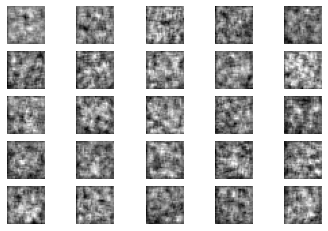

1 [D loss: 0.524614, acc.: 71.88%] [G loss: 0.688904]
2 [D loss: 0.465643, acc.: 81.25%] [G loss: 0.762662]
3 [D loss: 0.372068, acc.: 81.25%] [G loss: 0.943836]
4 [D loss: 0.325698, acc.: 81.25%] [G loss: 0.933700]
5 [D loss: 0.493859, acc.: 84.38%] [G loss: 1.152611]


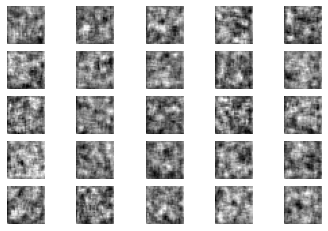

6 [D loss: 0.414081, acc.: 81.25%] [G loss: 1.406737]
7 [D loss: 0.414954, acc.: 84.38%] [G loss: 1.404679]
8 [D loss: 0.515856, acc.: 75.00%] [G loss: 1.850417]
9 [D loss: 0.608231, acc.: 68.75%] [G loss: 1.931421]
10 [D loss: 0.640145, acc.: 59.38%] [G loss: 1.964277]


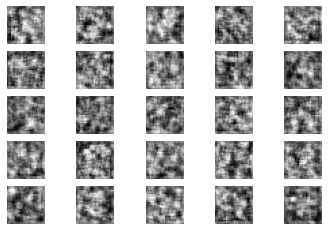

11 [D loss: 0.288348, acc.: 90.62%] [G loss: 1.832571]
12 [D loss: 0.266141, acc.: 93.75%] [G loss: 1.107498]
13 [D loss: 0.213524, acc.: 96.88%] [G loss: 0.899322]
14 [D loss: 0.255079, acc.: 93.75%] [G loss: 1.055973]
15 [D loss: 0.387066, acc.: 84.38%] [G loss: 1.400164]


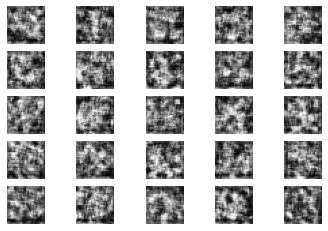

16 [D loss: 0.389075, acc.: 78.12%] [G loss: 1.257623]
17 [D loss: 0.397258, acc.: 78.12%] [G loss: 0.908463]
18 [D loss: 0.600460, acc.: 78.12%] [G loss: 1.178033]
19 [D loss: 0.744007, acc.: 62.50%] [G loss: 2.118604]
20 [D loss: 1.225705, acc.: 15.62%] [G loss: 1.979301]


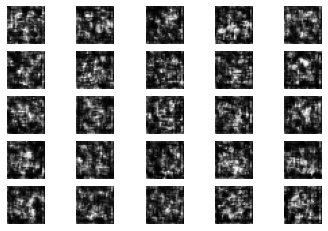

21 [D loss: 0.964946, acc.: 37.50%] [G loss: 1.777914]
22 [D loss: 0.713392, acc.: 53.12%] [G loss: 1.651401]
23 [D loss: 0.901283, acc.: 50.00%] [G loss: 0.951938]
24 [D loss: 0.560766, acc.: 71.88%] [G loss: 0.796736]
25 [D loss: 0.496565, acc.: 75.00%] [G loss: 1.029446]


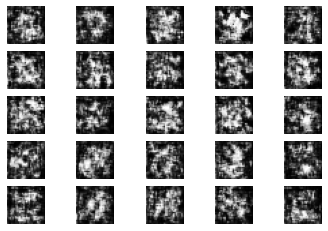

26 [D loss: 0.547295, acc.: 78.12%] [G loss: 0.970659]
27 [D loss: 0.439844, acc.: 78.12%] [G loss: 1.098956]
28 [D loss: 0.782716, acc.: 59.38%] [G loss: 1.378513]
29 [D loss: 0.779389, acc.: 56.25%] [G loss: 1.295265]
30 [D loss: 0.981076, acc.: 40.62%] [G loss: 1.361271]


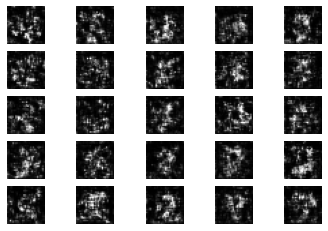

31 [D loss: 1.020405, acc.: 37.50%] [G loss: 1.209504]
32 [D loss: 1.114754, acc.: 43.75%] [G loss: 1.612408]
33 [D loss: 1.438341, acc.: 25.00%] [G loss: 1.056589]
34 [D loss: 0.736668, acc.: 59.38%] [G loss: 1.222118]
35 [D loss: 1.048280, acc.: 53.12%] [G loss: 1.010456]


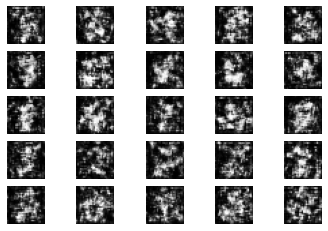

36 [D loss: 0.936320, acc.: 46.88%] [G loss: 0.878459]
37 [D loss: 0.834780, acc.: 53.12%] [G loss: 1.077950]
38 [D loss: 0.734314, acc.: 56.25%] [G loss: 1.136917]
39 [D loss: 0.390782, acc.: 75.00%] [G loss: 1.338916]
40 [D loss: 0.591946, acc.: 68.75%] [G loss: 1.034761]


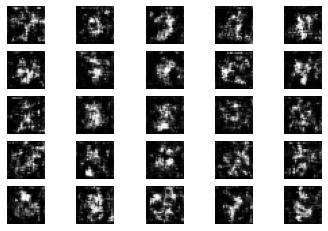

41 [D loss: 1.114014, acc.: 34.38%] [G loss: 1.879422]
42 [D loss: 0.758747, acc.: 62.50%] [G loss: 1.535863]
43 [D loss: 0.981552, acc.: 53.12%] [G loss: 0.698933]
44 [D loss: 0.785744, acc.: 53.12%] [G loss: 0.832053]
45 [D loss: 0.815040, acc.: 53.12%] [G loss: 0.925072]


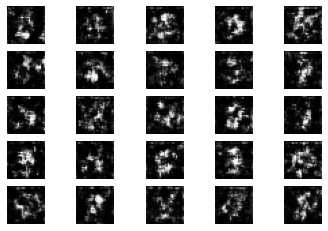

46 [D loss: 0.774599, acc.: 62.50%] [G loss: 1.400533]
47 [D loss: 1.137898, acc.: 50.00%] [G loss: 1.724800]
48 [D loss: 0.993585, acc.: 46.88%] [G loss: 1.629980]
49 [D loss: 0.978256, acc.: 40.62%] [G loss: 1.455277]
50 [D loss: 1.089534, acc.: 28.12%] [G loss: 1.282664]


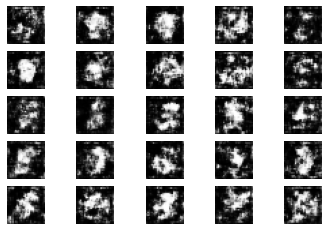

51 [D loss: 0.819245, acc.: 50.00%] [G loss: 1.639525]
52 [D loss: 0.738564, acc.: 56.25%] [G loss: 1.249486]
53 [D loss: 0.810599, acc.: 46.88%] [G loss: 1.365139]
54 [D loss: 0.859831, acc.: 53.12%] [G loss: 1.720367]
55 [D loss: 0.841929, acc.: 50.00%] [G loss: 1.440032]


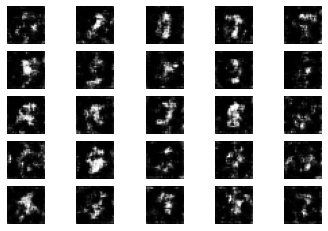

56 [D loss: 1.376239, acc.: 25.00%] [G loss: 1.438764]
57 [D loss: 0.746850, acc.: 68.75%] [G loss: 1.335893]
58 [D loss: 0.925811, acc.: 40.62%] [G loss: 1.066265]
59 [D loss: 0.577487, acc.: 68.75%] [G loss: 1.221658]
60 [D loss: 0.673408, acc.: 59.38%] [G loss: 1.562333]


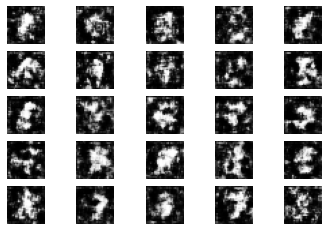

61 [D loss: 1.005055, acc.: 43.75%] [G loss: 2.275714]
62 [D loss: 0.949100, acc.: 40.62%] [G loss: 1.731887]
63 [D loss: 0.885653, acc.: 53.12%] [G loss: 1.187393]
64 [D loss: 0.813798, acc.: 50.00%] [G loss: 0.952775]
65 [D loss: 0.667951, acc.: 71.88%] [G loss: 1.316603]


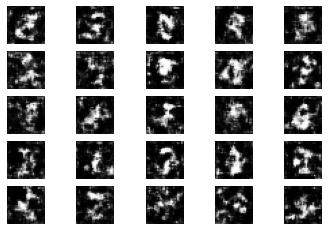

66 [D loss: 0.425045, acc.: 84.38%] [G loss: 1.637370]
67 [D loss: 1.135639, acc.: 40.62%] [G loss: 1.515943]
68 [D loss: 0.694633, acc.: 62.50%] [G loss: 1.385250]
69 [D loss: 0.963238, acc.: 40.62%] [G loss: 1.071386]
70 [D loss: 0.876809, acc.: 50.00%] [G loss: 1.013884]


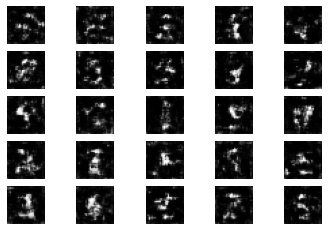

71 [D loss: 0.564950, acc.: 71.88%] [G loss: 1.141597]
72 [D loss: 0.492393, acc.: 78.12%] [G loss: 1.825652]
73 [D loss: 0.737052, acc.: 46.88%] [G loss: 1.509505]
74 [D loss: 0.968448, acc.: 43.75%] [G loss: 1.319227]
75 [D loss: 0.878118, acc.: 50.00%] [G loss: 1.546940]


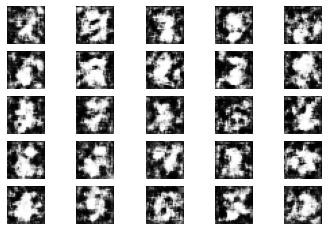

76 [D loss: 0.728607, acc.: 62.50%] [G loss: 1.170268]
77 [D loss: 0.487373, acc.: 71.88%] [G loss: 0.866757]
78 [D loss: 0.712617, acc.: 62.50%] [G loss: 0.920195]
79 [D loss: 0.507938, acc.: 68.75%] [G loss: 1.423605]
80 [D loss: 0.818157, acc.: 53.12%] [G loss: 1.117041]


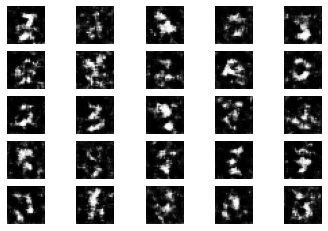

81 [D loss: 0.865118, acc.: 50.00%] [G loss: 0.929034]
82 [D loss: 0.835031, acc.: 46.88%] [G loss: 1.297279]
83 [D loss: 0.986357, acc.: 53.12%] [G loss: 1.186898]
84 [D loss: 0.679947, acc.: 59.38%] [G loss: 1.217224]
85 [D loss: 0.687342, acc.: 62.50%] [G loss: 1.016874]


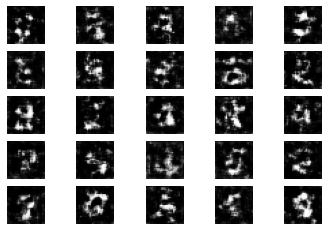

86 [D loss: 0.962827, acc.: 53.12%] [G loss: 1.941185]
87 [D loss: 0.652863, acc.: 65.62%] [G loss: 1.635927]
88 [D loss: 0.739936, acc.: 68.75%] [G loss: 1.386816]
89 [D loss: 0.847190, acc.: 56.25%] [G loss: 1.188108]
90 [D loss: 0.811964, acc.: 65.62%] [G loss: 1.560729]


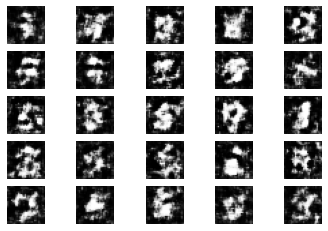

91 [D loss: 0.785323, acc.: 46.88%] [G loss: 1.658330]
92 [D loss: 0.844362, acc.: 59.38%] [G loss: 1.624081]
93 [D loss: 0.625720, acc.: 62.50%] [G loss: 1.436322]
94 [D loss: 0.778645, acc.: 59.38%] [G loss: 1.788076]
95 [D loss: 0.663454, acc.: 59.38%] [G loss: 1.788060]


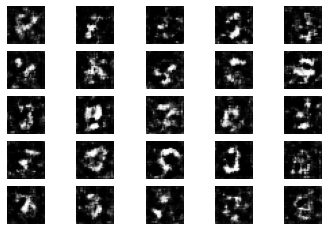

96 [D loss: 0.882340, acc.: 53.12%] [G loss: 1.417535]
97 [D loss: 0.896463, acc.: 40.62%] [G loss: 0.880508]
98 [D loss: 0.811486, acc.: 59.38%] [G loss: 1.260805]
99 [D loss: 0.799146, acc.: 43.75%] [G loss: 1.385862]
100 [D loss: 0.849902, acc.: 46.88%] [G loss: 1.005765]


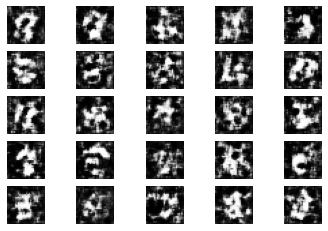

101 [D loss: 0.945941, acc.: 37.50%] [G loss: 1.172379]
102 [D loss: 0.783569, acc.: 56.25%] [G loss: 1.120617]
103 [D loss: 0.673613, acc.: 65.62%] [G loss: 1.540409]
104 [D loss: 0.582397, acc.: 65.62%] [G loss: 1.289936]
105 [D loss: 0.776744, acc.: 50.00%] [G loss: 1.535574]


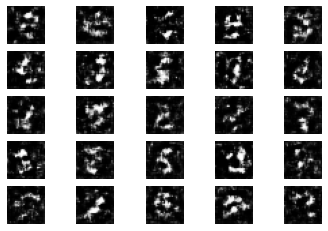

106 [D loss: 0.952957, acc.: 43.75%] [G loss: 0.851354]
107 [D loss: 0.948524, acc.: 50.00%] [G loss: 1.197432]
108 [D loss: 0.930983, acc.: 40.62%] [G loss: 1.449973]
109 [D loss: 0.763770, acc.: 53.12%] [G loss: 1.149776]
110 [D loss: 0.713253, acc.: 46.88%] [G loss: 1.300745]


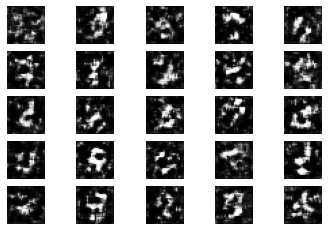

111 [D loss: 0.716668, acc.: 53.12%] [G loss: 1.180555]
112 [D loss: 0.707088, acc.: 46.88%] [G loss: 1.207221]
113 [D loss: 1.109537, acc.: 37.50%] [G loss: 1.573160]
114 [D loss: 0.719833, acc.: 53.12%] [G loss: 0.997579]
115 [D loss: 0.796657, acc.: 50.00%] [G loss: 1.131446]


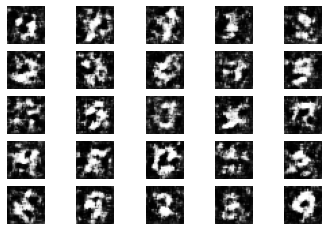

116 [D loss: 0.872359, acc.: 50.00%] [G loss: 1.122062]
117 [D loss: 0.525822, acc.: 75.00%] [G loss: 1.419925]
118 [D loss: 0.620066, acc.: 59.38%] [G loss: 1.020085]
119 [D loss: 0.800982, acc.: 56.25%] [G loss: 1.180772]
120 [D loss: 0.629326, acc.: 71.88%] [G loss: 1.147360]


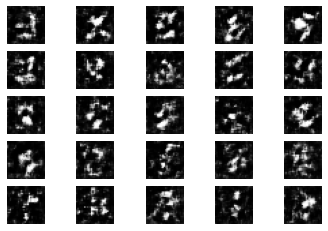

121 [D loss: 0.890820, acc.: 40.62%] [G loss: 1.230985]
122 [D loss: 0.681775, acc.: 71.88%] [G loss: 1.432092]
123 [D loss: 0.919861, acc.: 56.25%] [G loss: 1.140304]
124 [D loss: 0.753036, acc.: 59.38%] [G loss: 0.990105]
125 [D loss: 0.858201, acc.: 50.00%] [G loss: 1.015261]


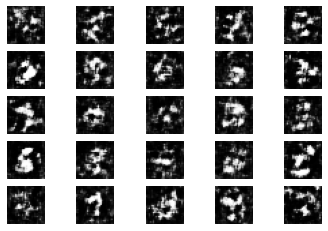

126 [D loss: 0.736668, acc.: 68.75%] [G loss: 1.134582]
127 [D loss: 0.966328, acc.: 46.88%] [G loss: 1.277959]
128 [D loss: 0.866879, acc.: 53.12%] [G loss: 1.312141]
129 [D loss: 0.879850, acc.: 59.38%] [G loss: 1.290088]
130 [D loss: 0.856880, acc.: 53.12%] [G loss: 0.557944]


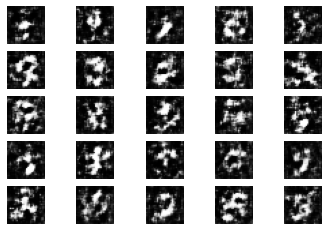

131 [D loss: 0.622215, acc.: 71.88%] [G loss: 1.272885]
132 [D loss: 0.930266, acc.: 50.00%] [G loss: 1.172728]
133 [D loss: 0.937407, acc.: 59.38%] [G loss: 1.174955]
134 [D loss: 0.917140, acc.: 37.50%] [G loss: 0.850284]
135 [D loss: 1.011864, acc.: 34.38%] [G loss: 1.011642]


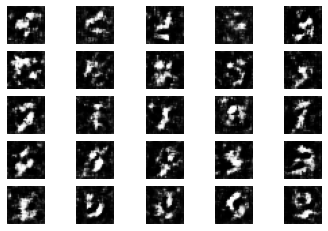

136 [D loss: 0.645217, acc.: 68.75%] [G loss: 0.993182]
137 [D loss: 0.498615, acc.: 75.00%] [G loss: 1.220085]
138 [D loss: 0.722091, acc.: 56.25%] [G loss: 1.154826]
139 [D loss: 0.846179, acc.: 59.38%] [G loss: 1.010884]
140 [D loss: 0.962613, acc.: 43.75%] [G loss: 1.039952]


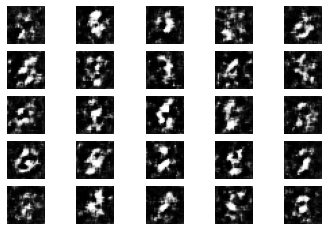

141 [D loss: 0.771575, acc.: 59.38%] [G loss: 1.154626]
142 [D loss: 0.985964, acc.: 46.88%] [G loss: 1.339015]
143 [D loss: 0.950047, acc.: 43.75%] [G loss: 1.194236]
144 [D loss: 0.789731, acc.: 59.38%] [G loss: 1.137516]
145 [D loss: 0.713256, acc.: 68.75%] [G loss: 0.737268]


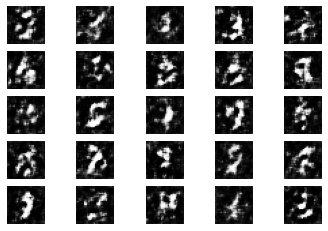

146 [D loss: 1.032241, acc.: 43.75%] [G loss: 1.078144]
147 [D loss: 1.049744, acc.: 31.25%] [G loss: 1.348976]
148 [D loss: 0.620366, acc.: 62.50%] [G loss: 1.183061]
149 [D loss: 1.020145, acc.: 40.62%] [G loss: 1.144108]
150 [D loss: 0.802717, acc.: 56.25%] [G loss: 1.608513]


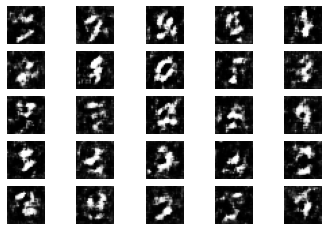

151 [D loss: 0.661559, acc.: 56.25%] [G loss: 1.614039]
152 [D loss: 1.005883, acc.: 43.75%] [G loss: 0.889804]
153 [D loss: 0.844647, acc.: 56.25%] [G loss: 1.447557]
154 [D loss: 0.797123, acc.: 53.12%] [G loss: 1.041322]
155 [D loss: 0.838547, acc.: 37.50%] [G loss: 1.250289]


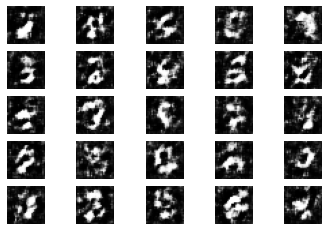

156 [D loss: 0.704498, acc.: 62.50%] [G loss: 1.107859]
157 [D loss: 0.529635, acc.: 78.12%] [G loss: 1.305164]
158 [D loss: 0.732450, acc.: 65.62%] [G loss: 1.080162]
159 [D loss: 0.743827, acc.: 50.00%] [G loss: 0.964493]
160 [D loss: 0.994337, acc.: 34.38%] [G loss: 1.523820]


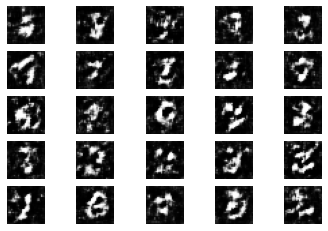

161 [D loss: 0.630805, acc.: 71.88%] [G loss: 0.892020]
162 [D loss: 0.909429, acc.: 40.62%] [G loss: 1.611951]
163 [D loss: 0.929698, acc.: 43.75%] [G loss: 1.047577]
164 [D loss: 0.630526, acc.: 68.75%] [G loss: 0.938265]
165 [D loss: 1.083987, acc.: 40.62%] [G loss: 1.333969]


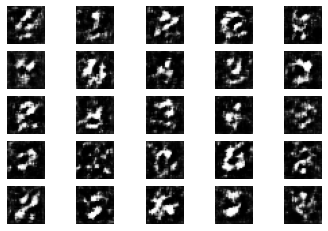

166 [D loss: 0.799072, acc.: 59.38%] [G loss: 1.240670]
167 [D loss: 0.822122, acc.: 53.12%] [G loss: 1.599294]
168 [D loss: 0.778338, acc.: 65.62%] [G loss: 1.367962]
169 [D loss: 0.622202, acc.: 65.62%] [G loss: 1.024849]
170 [D loss: 0.748262, acc.: 59.38%] [G loss: 1.184554]


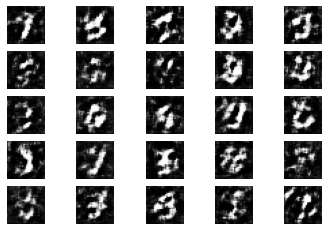

171 [D loss: 0.748871, acc.: 59.38%] [G loss: 1.051135]
172 [D loss: 0.898066, acc.: 50.00%] [G loss: 1.137616]
173 [D loss: 0.778056, acc.: 50.00%] [G loss: 1.062834]
174 [D loss: 0.765585, acc.: 59.38%] [G loss: 1.177315]
175 [D loss: 0.674920, acc.: 65.62%] [G loss: 1.128848]


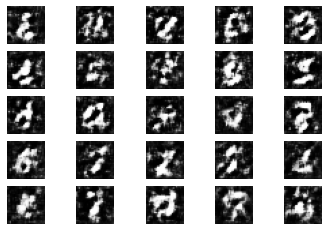

176 [D loss: 0.723013, acc.: 56.25%] [G loss: 1.444022]
177 [D loss: 0.851827, acc.: 56.25%] [G loss: 1.245715]
178 [D loss: 0.742829, acc.: 59.38%] [G loss: 1.174986]
179 [D loss: 0.731750, acc.: 59.38%] [G loss: 1.363280]
180 [D loss: 0.825065, acc.: 50.00%] [G loss: 1.196340]


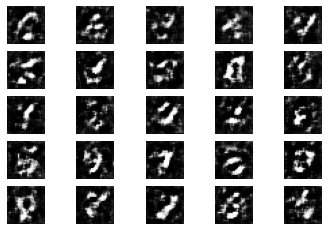

181 [D loss: 1.020531, acc.: 43.75%] [G loss: 0.767224]
182 [D loss: 1.051945, acc.: 43.75%] [G loss: 1.476889]
183 [D loss: 0.727046, acc.: 65.62%] [G loss: 1.233845]
184 [D loss: 0.633483, acc.: 71.88%] [G loss: 1.369651]
185 [D loss: 0.928833, acc.: 40.62%] [G loss: 1.006583]


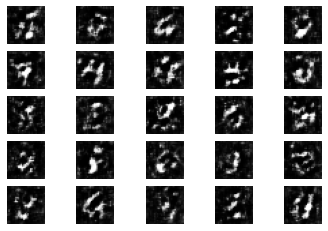

186 [D loss: 0.677205, acc.: 65.62%] [G loss: 0.878156]
187 [D loss: 0.727859, acc.: 46.88%] [G loss: 0.891641]
188 [D loss: 1.051568, acc.: 46.88%] [G loss: 1.059413]
189 [D loss: 0.645754, acc.: 62.50%] [G loss: 0.890033]
190 [D loss: 0.855445, acc.: 43.75%] [G loss: 1.020682]


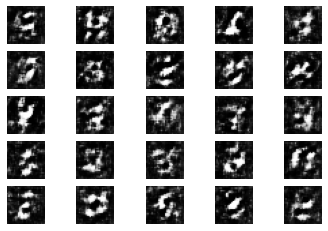

191 [D loss: 0.780931, acc.: 50.00%] [G loss: 1.346700]
192 [D loss: 0.686167, acc.: 53.12%] [G loss: 1.338790]
193 [D loss: 1.088471, acc.: 43.75%] [G loss: 1.069029]
194 [D loss: 0.598207, acc.: 75.00%] [G loss: 1.350173]
195 [D loss: 0.571428, acc.: 65.62%] [G loss: 0.976761]


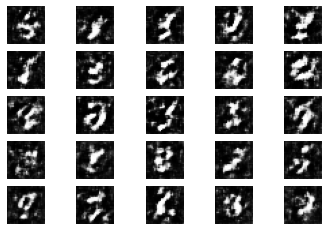

196 [D loss: 1.003477, acc.: 37.50%] [G loss: 0.897674]
197 [D loss: 0.803877, acc.: 46.88%] [G loss: 1.289939]
198 [D loss: 0.774268, acc.: 50.00%] [G loss: 1.205404]
199 [D loss: 0.778176, acc.: 56.25%] [G loss: 1.124422]
200 [D loss: 0.990868, acc.: 43.75%] [G loss: 1.107836]


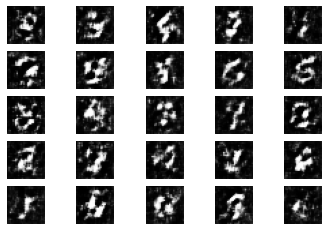

201 [D loss: 0.787058, acc.: 50.00%] [G loss: 1.279101]
202 [D loss: 0.832549, acc.: 46.88%] [G loss: 1.002306]
203 [D loss: 1.071044, acc.: 37.50%] [G loss: 1.190947]
204 [D loss: 0.594528, acc.: 75.00%] [G loss: 1.173627]
205 [D loss: 0.736689, acc.: 62.50%] [G loss: 1.017171]


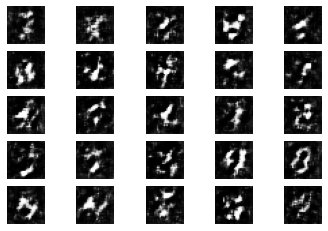

206 [D loss: 0.650531, acc.: 75.00%] [G loss: 1.243086]
207 [D loss: 0.604927, acc.: 68.75%] [G loss: 1.010926]
208 [D loss: 0.857597, acc.: 50.00%] [G loss: 1.142600]
209 [D loss: 0.913041, acc.: 53.12%] [G loss: 1.032269]
210 [D loss: 0.564008, acc.: 71.88%] [G loss: 1.009572]


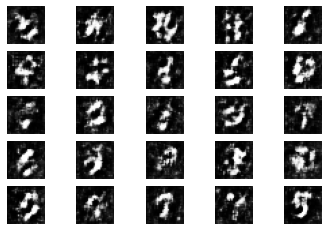

211 [D loss: 0.841839, acc.: 53.12%] [G loss: 0.913903]
212 [D loss: 0.754842, acc.: 53.12%] [G loss: 1.085973]
213 [D loss: 0.783511, acc.: 56.25%] [G loss: 1.188679]
214 [D loss: 0.862474, acc.: 50.00%] [G loss: 1.462233]
215 [D loss: 0.917004, acc.: 40.62%] [G loss: 1.403743]


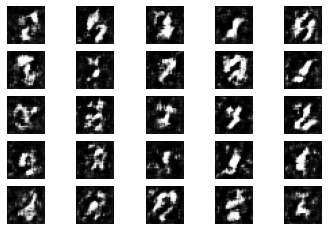

216 [D loss: 0.905846, acc.: 43.75%] [G loss: 1.022088]
217 [D loss: 1.019180, acc.: 50.00%] [G loss: 0.911423]
218 [D loss: 0.741606, acc.: 56.25%] [G loss: 1.219382]
219 [D loss: 0.680946, acc.: 56.25%] [G loss: 1.172295]
220 [D loss: 0.627645, acc.: 56.25%] [G loss: 1.091790]


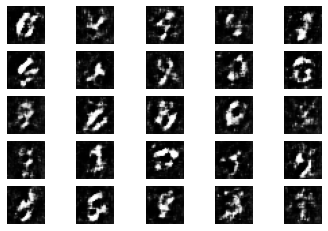

221 [D loss: 1.022668, acc.: 34.38%] [G loss: 1.046066]
222 [D loss: 0.832894, acc.: 59.38%] [G loss: 1.053162]
223 [D loss: 0.570870, acc.: 71.88%] [G loss: 1.174181]
224 [D loss: 0.727185, acc.: 65.62%] [G loss: 0.973535]
225 [D loss: 0.629176, acc.: 62.50%] [G loss: 0.860253]


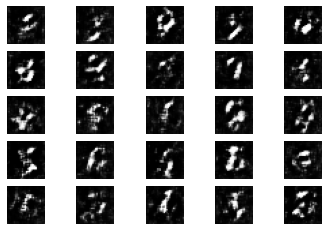

226 [D loss: 0.886902, acc.: 50.00%] [G loss: 0.913654]
227 [D loss: 0.770799, acc.: 53.12%] [G loss: 1.077903]
228 [D loss: 0.644638, acc.: 65.62%] [G loss: 1.344828]
229 [D loss: 0.718709, acc.: 50.00%] [G loss: 0.985270]
230 [D loss: 0.756511, acc.: 56.25%] [G loss: 1.096197]


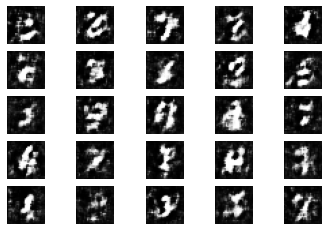

231 [D loss: 1.019976, acc.: 37.50%] [G loss: 1.191452]
232 [D loss: 0.798862, acc.: 56.25%] [G loss: 1.246107]
233 [D loss: 0.872116, acc.: 56.25%] [G loss: 1.000870]
234 [D loss: 0.760871, acc.: 62.50%] [G loss: 1.291633]
235 [D loss: 0.763192, acc.: 56.25%] [G loss: 1.624645]


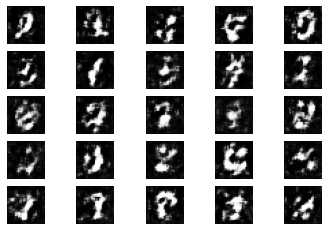

236 [D loss: 0.872107, acc.: 53.12%] [G loss: 0.922597]
237 [D loss: 0.617327, acc.: 68.75%] [G loss: 1.340839]
238 [D loss: 0.712605, acc.: 56.25%] [G loss: 1.097126]
239 [D loss: 0.782462, acc.: 56.25%] [G loss: 0.985119]
240 [D loss: 0.693709, acc.: 62.50%] [G loss: 1.157512]


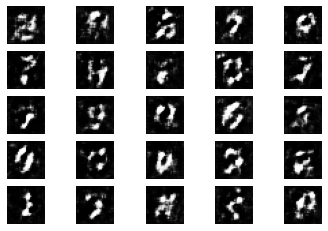

241 [D loss: 1.124512, acc.: 50.00%] [G loss: 1.089531]
242 [D loss: 0.871089, acc.: 40.62%] [G loss: 1.001635]
243 [D loss: 0.647163, acc.: 65.62%] [G loss: 1.414702]
244 [D loss: 0.787042, acc.: 56.25%] [G loss: 1.518833]
245 [D loss: 0.797698, acc.: 56.25%] [G loss: 1.284158]


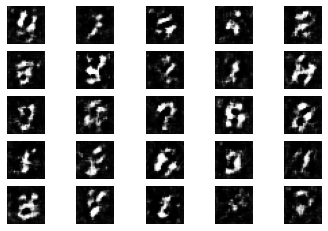

246 [D loss: 0.901061, acc.: 53.12%] [G loss: 0.828731]
247 [D loss: 0.637730, acc.: 62.50%] [G loss: 1.301528]
248 [D loss: 0.725373, acc.: 46.88%] [G loss: 0.938256]
249 [D loss: 0.728219, acc.: 59.38%] [G loss: 1.470537]
250 [D loss: 0.827451, acc.: 46.88%] [G loss: 1.357949]


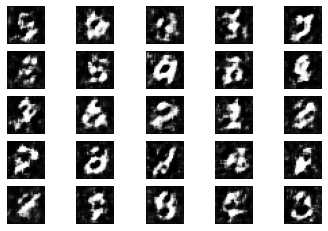

251 [D loss: 0.744193, acc.: 53.12%] [G loss: 1.029202]
252 [D loss: 0.785835, acc.: 50.00%] [G loss: 1.009575]
253 [D loss: 0.807023, acc.: 59.38%] [G loss: 1.038687]
254 [D loss: 0.988592, acc.: 46.88%] [G loss: 0.961330]
255 [D loss: 0.925677, acc.: 37.50%] [G loss: 1.123981]


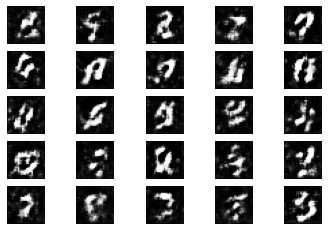

256 [D loss: 0.972135, acc.: 40.62%] [G loss: 1.441843]
257 [D loss: 1.040993, acc.: 43.75%] [G loss: 1.034294]
258 [D loss: 0.743332, acc.: 56.25%] [G loss: 1.062149]
259 [D loss: 0.508586, acc.: 81.25%] [G loss: 0.972644]
260 [D loss: 0.806519, acc.: 53.12%] [G loss: 0.959917]


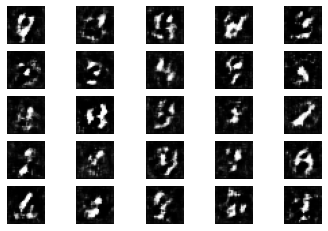

261 [D loss: 0.745827, acc.: 65.62%] [G loss: 0.819308]
262 [D loss: 0.800265, acc.: 56.25%] [G loss: 1.260546]
263 [D loss: 0.861678, acc.: 43.75%] [G loss: 1.278376]
264 [D loss: 0.638742, acc.: 56.25%] [G loss: 1.269807]
265 [D loss: 1.303097, acc.: 18.75%] [G loss: 1.391329]


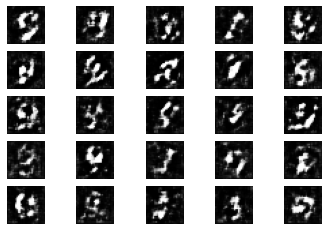

266 [D loss: 0.926452, acc.: 40.62%] [G loss: 0.991892]
267 [D loss: 0.755341, acc.: 56.25%] [G loss: 1.044240]
268 [D loss: 0.957075, acc.: 37.50%] [G loss: 1.120301]
269 [D loss: 0.751861, acc.: 56.25%] [G loss: 1.233223]
270 [D loss: 0.804325, acc.: 46.88%] [G loss: 1.119646]


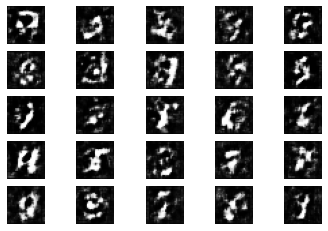

271 [D loss: 0.926470, acc.: 43.75%] [G loss: 1.176334]
272 [D loss: 0.794683, acc.: 56.25%] [G loss: 1.244962]
273 [D loss: 1.110340, acc.: 37.50%] [G loss: 0.893119]
274 [D loss: 0.753112, acc.: 59.38%] [G loss: 0.924087]
275 [D loss: 0.877596, acc.: 53.12%] [G loss: 1.161686]


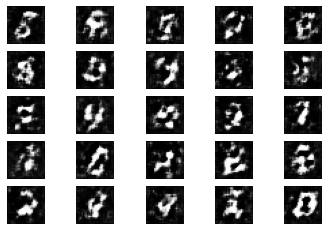

276 [D loss: 0.666774, acc.: 65.62%] [G loss: 0.910791]
277 [D loss: 0.897220, acc.: 50.00%] [G loss: 1.239300]
278 [D loss: 0.749859, acc.: 50.00%] [G loss: 1.185223]
279 [D loss: 0.747283, acc.: 65.62%] [G loss: 1.202400]
280 [D loss: 0.822739, acc.: 46.88%] [G loss: 1.282024]


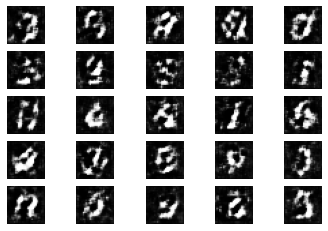

281 [D loss: 0.936128, acc.: 46.88%] [G loss: 1.239529]
282 [D loss: 0.904670, acc.: 43.75%] [G loss: 1.361128]
283 [D loss: 0.860336, acc.: 46.88%] [G loss: 1.057761]
284 [D loss: 0.822538, acc.: 46.88%] [G loss: 1.209951]
285 [D loss: 0.573905, acc.: 62.50%] [G loss: 1.295995]


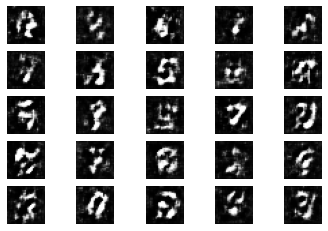

286 [D loss: 0.932882, acc.: 37.50%] [G loss: 0.813833]
287 [D loss: 0.677356, acc.: 59.38%] [G loss: 1.060833]
288 [D loss: 0.523083, acc.: 78.12%] [G loss: 1.217304]
289 [D loss: 0.981557, acc.: 37.50%] [G loss: 1.194298]
290 [D loss: 0.945011, acc.: 43.75%] [G loss: 1.214700]


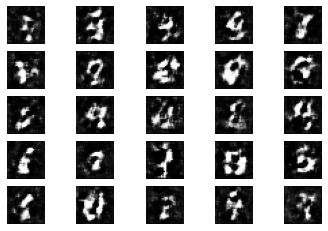

291 [D loss: 0.642170, acc.: 56.25%] [G loss: 1.223031]
292 [D loss: 0.761890, acc.: 59.38%] [G loss: 1.083115]
293 [D loss: 0.735223, acc.: 50.00%] [G loss: 1.112568]
294 [D loss: 0.886074, acc.: 50.00%] [G loss: 0.899406]
295 [D loss: 0.828915, acc.: 53.12%] [G loss: 1.347641]


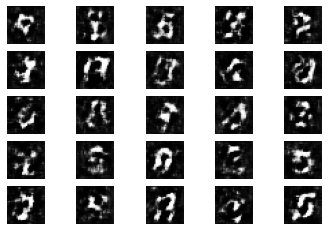

296 [D loss: 0.766379, acc.: 46.88%] [G loss: 1.498493]
297 [D loss: 0.979560, acc.: 53.12%] [G loss: 0.682946]
298 [D loss: 1.070451, acc.: 37.50%] [G loss: 1.138624]
299 [D loss: 0.755977, acc.: 65.62%] [G loss: 1.366365]
300 [D loss: 0.817281, acc.: 56.25%] [G loss: 1.254563]


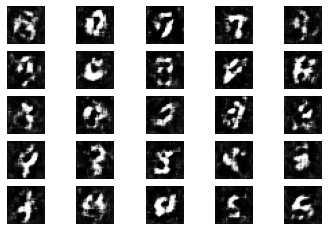

301 [D loss: 1.021472, acc.: 34.38%] [G loss: 1.011552]
302 [D loss: 0.786320, acc.: 62.50%] [G loss: 1.061148]
303 [D loss: 0.773053, acc.: 53.12%] [G loss: 1.208123]
304 [D loss: 1.019679, acc.: 37.50%] [G loss: 1.151947]
305 [D loss: 0.789277, acc.: 50.00%] [G loss: 1.270205]


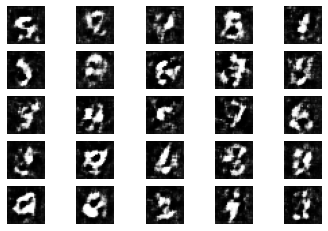

306 [D loss: 0.853107, acc.: 59.38%] [G loss: 1.145750]
307 [D loss: 0.559446, acc.: 78.12%] [G loss: 1.102319]
308 [D loss: 0.746243, acc.: 56.25%] [G loss: 1.127265]
309 [D loss: 0.778848, acc.: 46.88%] [G loss: 1.103049]
310 [D loss: 0.811018, acc.: 53.12%] [G loss: 0.837099]


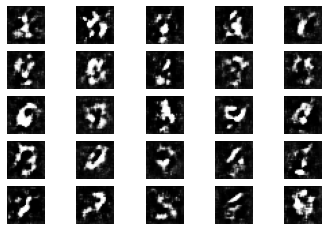

311 [D loss: 0.957836, acc.: 53.12%] [G loss: 0.896334]
312 [D loss: 0.637568, acc.: 68.75%] [G loss: 1.315386]
313 [D loss: 0.848109, acc.: 46.88%] [G loss: 1.118779]
314 [D loss: 0.708366, acc.: 56.25%] [G loss: 1.134626]
315 [D loss: 0.670593, acc.: 50.00%] [G loss: 0.851715]


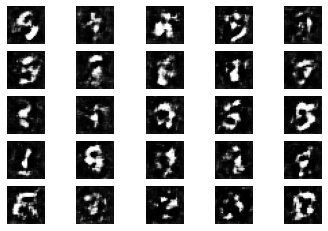

316 [D loss: 0.710075, acc.: 65.62%] [G loss: 1.385279]
317 [D loss: 0.852892, acc.: 50.00%] [G loss: 1.115282]
318 [D loss: 0.951707, acc.: 40.62%] [G loss: 0.891837]
319 [D loss: 0.615663, acc.: 68.75%] [G loss: 0.845453]
320 [D loss: 0.591529, acc.: 59.38%] [G loss: 1.108420]


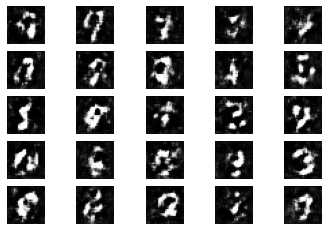

321 [D loss: 0.666496, acc.: 59.38%] [G loss: 1.128138]
322 [D loss: 0.679741, acc.: 53.12%] [G loss: 0.965367]
323 [D loss: 0.733173, acc.: 62.50%] [G loss: 1.270409]
324 [D loss: 0.750344, acc.: 59.38%] [G loss: 1.364903]
325 [D loss: 0.633663, acc.: 68.75%] [G loss: 0.929044]


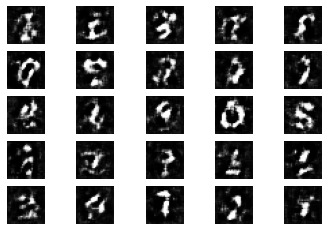

326 [D loss: 0.952801, acc.: 50.00%] [G loss: 1.175714]
327 [D loss: 0.759092, acc.: 56.25%] [G loss: 1.141045]
328 [D loss: 1.010558, acc.: 31.25%] [G loss: 1.024192]
329 [D loss: 0.680027, acc.: 62.50%] [G loss: 1.000765]
330 [D loss: 0.690517, acc.: 56.25%] [G loss: 1.026330]


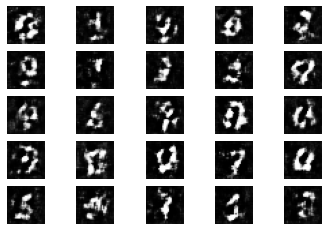

331 [D loss: 0.664265, acc.: 71.88%] [G loss: 1.265038]
332 [D loss: 0.961595, acc.: 46.88%] [G loss: 0.804820]
333 [D loss: 0.571795, acc.: 65.62%] [G loss: 1.064052]
334 [D loss: 0.884275, acc.: 50.00%] [G loss: 1.118802]
335 [D loss: 1.014870, acc.: 34.38%] [G loss: 1.165329]


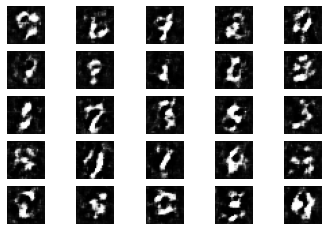

336 [D loss: 0.897097, acc.: 37.50%] [G loss: 0.988728]
337 [D loss: 0.886675, acc.: 40.62%] [G loss: 1.165920]
338 [D loss: 0.662029, acc.: 62.50%] [G loss: 1.202127]
339 [D loss: 0.859016, acc.: 43.75%] [G loss: 1.041013]
340 [D loss: 0.691370, acc.: 75.00%] [G loss: 1.357717]


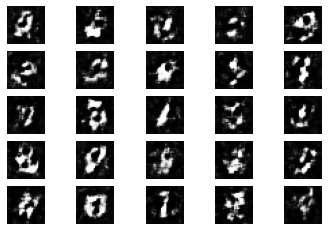

341 [D loss: 0.645583, acc.: 59.38%] [G loss: 1.100954]
342 [D loss: 0.825594, acc.: 43.75%] [G loss: 0.987678]
343 [D loss: 0.996393, acc.: 43.75%] [G loss: 0.942325]
344 [D loss: 0.506093, acc.: 84.38%] [G loss: 0.992090]
345 [D loss: 0.980214, acc.: 40.62%] [G loss: 1.022980]


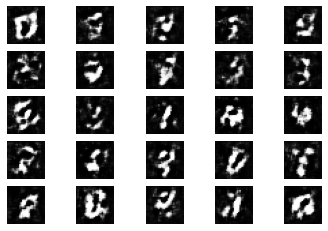

346 [D loss: 0.806207, acc.: 56.25%] [G loss: 1.123299]
347 [D loss: 0.722983, acc.: 56.25%] [G loss: 1.032246]
348 [D loss: 0.870664, acc.: 53.12%] [G loss: 1.175460]
349 [D loss: 0.671066, acc.: 53.12%] [G loss: 0.918481]
350 [D loss: 0.660542, acc.: 65.62%] [G loss: 1.184070]


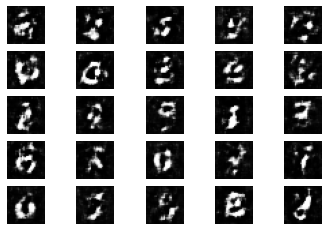

351 [D loss: 0.850538, acc.: 46.88%] [G loss: 0.774944]
352 [D loss: 0.754020, acc.: 53.12%] [G loss: 0.924226]
353 [D loss: 0.569914, acc.: 62.50%] [G loss: 1.034582]
354 [D loss: 0.605485, acc.: 68.75%] [G loss: 1.168090]
355 [D loss: 0.541339, acc.: 62.50%] [G loss: 0.846127]


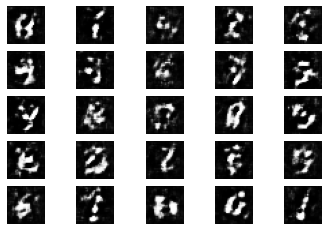

356 [D loss: 0.835654, acc.: 43.75%] [G loss: 1.053413]
357 [D loss: 0.774000, acc.: 56.25%] [G loss: 1.190218]
358 [D loss: 0.747809, acc.: 56.25%] [G loss: 1.337564]
359 [D loss: 0.864717, acc.: 34.38%] [G loss: 1.343654]
360 [D loss: 0.570302, acc.: 75.00%] [G loss: 1.420730]


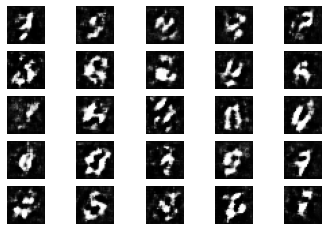

361 [D loss: 0.776531, acc.: 50.00%] [G loss: 1.203078]
362 [D loss: 0.982640, acc.: 43.75%] [G loss: 1.212776]
363 [D loss: 0.642142, acc.: 62.50%] [G loss: 1.151449]
364 [D loss: 0.759457, acc.: 62.50%] [G loss: 1.165673]
365 [D loss: 0.748268, acc.: 53.12%] [G loss: 1.478451]


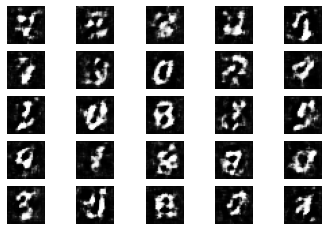

366 [D loss: 0.869175, acc.: 59.38%] [G loss: 1.196546]
367 [D loss: 0.551385, acc.: 75.00%] [G loss: 0.792716]
368 [D loss: 0.729674, acc.: 56.25%] [G loss: 1.417151]
369 [D loss: 0.598789, acc.: 68.75%] [G loss: 1.103876]
370 [D loss: 0.560714, acc.: 75.00%] [G loss: 0.858360]


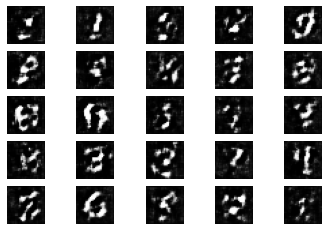

371 [D loss: 0.831391, acc.: 53.12%] [G loss: 1.022948]
372 [D loss: 0.605975, acc.: 68.75%] [G loss: 1.140180]
373 [D loss: 1.125153, acc.: 28.12%] [G loss: 0.726358]
374 [D loss: 0.902198, acc.: 40.62%] [G loss: 0.906638]
375 [D loss: 1.160652, acc.: 37.50%] [G loss: 0.941209]


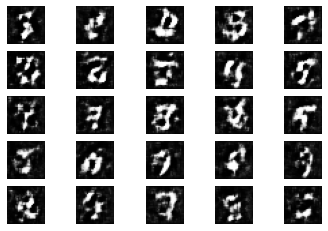

376 [D loss: 0.566207, acc.: 71.88%] [G loss: 1.040173]
377 [D loss: 0.611985, acc.: 62.50%] [G loss: 1.046359]
378 [D loss: 0.430555, acc.: 78.12%] [G loss: 1.562507]
379 [D loss: 0.822709, acc.: 56.25%] [G loss: 1.092988]
380 [D loss: 0.614417, acc.: 62.50%] [G loss: 0.832060]


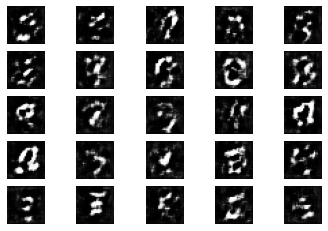

381 [D loss: 0.662252, acc.: 65.62%] [G loss: 0.853940]
382 [D loss: 0.561716, acc.: 71.88%] [G loss: 0.973213]
383 [D loss: 0.670566, acc.: 59.38%] [G loss: 1.015625]
384 [D loss: 0.492175, acc.: 81.25%] [G loss: 1.182130]
385 [D loss: 0.504850, acc.: 78.12%] [G loss: 0.838693]


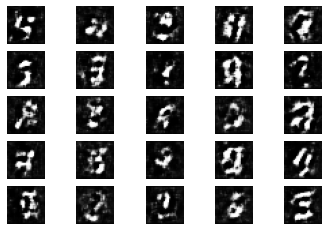

386 [D loss: 0.492001, acc.: 81.25%] [G loss: 0.781933]
387 [D loss: 0.856303, acc.: 37.50%] [G loss: 1.023244]
388 [D loss: 0.879212, acc.: 43.75%] [G loss: 0.946587]
389 [D loss: 0.785659, acc.: 50.00%] [G loss: 1.043631]
390 [D loss: 0.852247, acc.: 37.50%] [G loss: 0.969017]


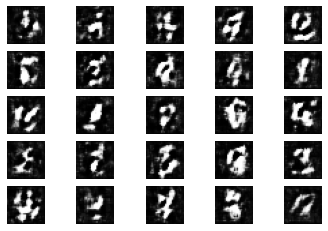

391 [D loss: 0.510871, acc.: 68.75%] [G loss: 0.958846]
392 [D loss: 1.190559, acc.: 18.75%] [G loss: 0.968007]
393 [D loss: 0.577471, acc.: 65.62%] [G loss: 1.375175]
394 [D loss: 0.671947, acc.: 62.50%] [G loss: 0.955660]
395 [D loss: 0.793016, acc.: 46.88%] [G loss: 1.031647]


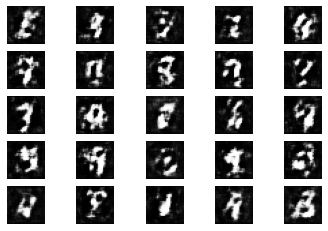

396 [D loss: 0.611382, acc.: 71.88%] [G loss: 1.359828]
397 [D loss: 0.778550, acc.: 59.38%] [G loss: 0.782491]
398 [D loss: 0.668774, acc.: 65.62%] [G loss: 1.014074]
399 [D loss: 0.666092, acc.: 65.62%] [G loss: 1.100208]
400 [D loss: 0.678601, acc.: 59.38%] [G loss: 0.912575]


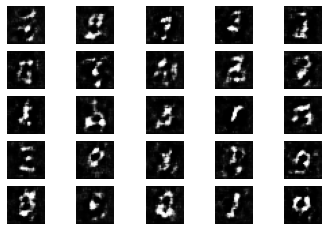

401 [D loss: 0.310606, acc.: 90.62%] [G loss: 0.981610]
402 [D loss: 0.524551, acc.: 71.88%] [G loss: 1.125378]
403 [D loss: 0.704869, acc.: 46.88%] [G loss: 0.842615]
404 [D loss: 0.651194, acc.: 59.38%] [G loss: 1.060865]
405 [D loss: 0.469017, acc.: 81.25%] [G loss: 0.936419]


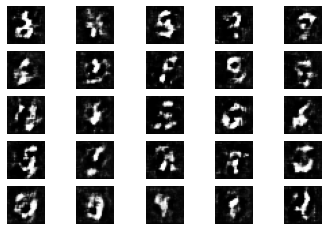

406 [D loss: 0.448969, acc.: 75.00%] [G loss: 1.070933]
407 [D loss: 0.762695, acc.: 62.50%] [G loss: 1.061441]
408 [D loss: 0.678695, acc.: 56.25%] [G loss: 1.402367]
409 [D loss: 0.537302, acc.: 75.00%] [G loss: 0.969598]
410 [D loss: 0.620507, acc.: 56.25%] [G loss: 1.164588]


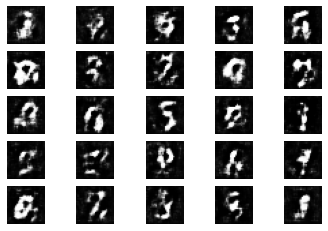

411 [D loss: 0.690144, acc.: 59.38%] [G loss: 1.447903]
412 [D loss: 0.987936, acc.: 46.88%] [G loss: 1.116977]
413 [D loss: 1.073303, acc.: 28.12%] [G loss: 0.925670]
414 [D loss: 0.914862, acc.: 59.38%] [G loss: 1.181000]
415 [D loss: 0.932445, acc.: 37.50%] [G loss: 1.013178]


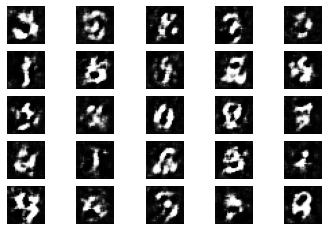

416 [D loss: 1.059777, acc.: 43.75%] [G loss: 0.881565]
417 [D loss: 0.719587, acc.: 71.88%] [G loss: 1.135817]
418 [D loss: 0.745879, acc.: 65.62%] [G loss: 1.017956]
419 [D loss: 0.987411, acc.: 40.62%] [G loss: 0.935571]
420 [D loss: 0.640487, acc.: 65.62%] [G loss: 0.842173]


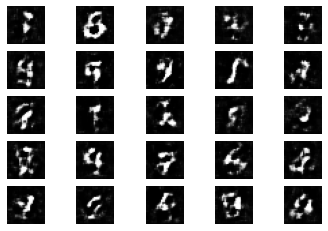

421 [D loss: 0.546499, acc.: 75.00%] [G loss: 1.154019]
422 [D loss: 0.435802, acc.: 78.12%] [G loss: 0.988190]
423 [D loss: 0.547636, acc.: 68.75%] [G loss: 0.908984]
424 [D loss: 0.594543, acc.: 75.00%] [G loss: 0.803447]
425 [D loss: 0.542292, acc.: 75.00%] [G loss: 1.257712]


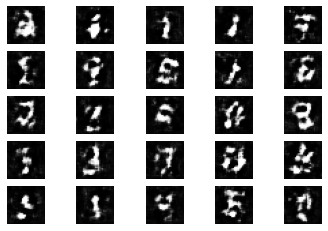

426 [D loss: 0.630335, acc.: 71.88%] [G loss: 1.327340]
427 [D loss: 0.801874, acc.: 56.25%] [G loss: 1.037323]
428 [D loss: 0.732520, acc.: 59.38%] [G loss: 1.392333]
429 [D loss: 0.777187, acc.: 50.00%] [G loss: 1.089198]
430 [D loss: 0.899200, acc.: 46.88%] [G loss: 1.272449]


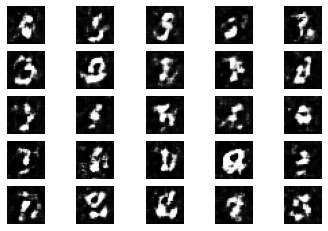

431 [D loss: 0.566735, acc.: 65.62%] [G loss: 1.065060]
432 [D loss: 0.782578, acc.: 56.25%] [G loss: 1.019732]
433 [D loss: 0.948692, acc.: 37.50%] [G loss: 1.023228]
434 [D loss: 0.624393, acc.: 59.38%] [G loss: 0.990426]
435 [D loss: 0.612691, acc.: 56.25%] [G loss: 0.777622]


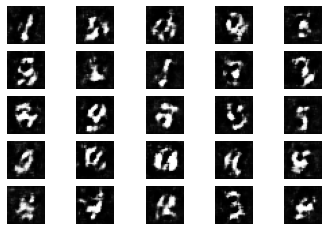

436 [D loss: 0.926483, acc.: 50.00%] [G loss: 1.136392]
437 [D loss: 0.834300, acc.: 53.12%] [G loss: 1.046829]
438 [D loss: 0.549363, acc.: 71.88%] [G loss: 1.235046]
439 [D loss: 0.459604, acc.: 75.00%] [G loss: 1.089434]
440 [D loss: 0.623186, acc.: 68.75%] [G loss: 0.929799]


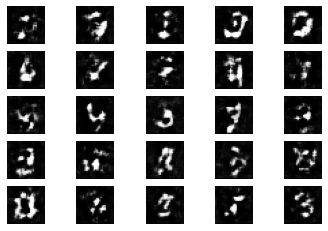

441 [D loss: 0.248646, acc.: 93.75%] [G loss: 0.990062]
442 [D loss: 0.415007, acc.: 84.38%] [G loss: 0.879046]
443 [D loss: 0.639078, acc.: 78.12%] [G loss: 0.822236]
444 [D loss: 0.666280, acc.: 53.12%] [G loss: 1.050700]
445 [D loss: 0.678839, acc.: 59.38%] [G loss: 0.961379]


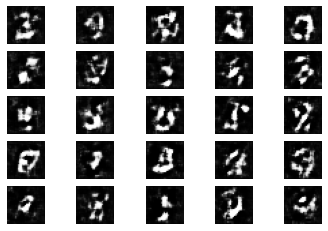

446 [D loss: 0.737395, acc.: 59.38%] [G loss: 0.863667]
447 [D loss: 0.538697, acc.: 59.38%] [G loss: 1.592509]
448 [D loss: 1.134415, acc.: 18.75%] [G loss: 1.173504]
449 [D loss: 0.750790, acc.: 46.88%] [G loss: 1.226463]
450 [D loss: 0.828669, acc.: 50.00%] [G loss: 0.771612]


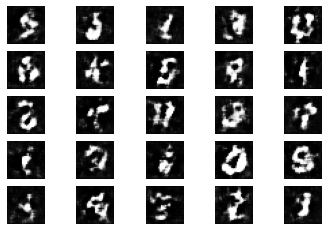

451 [D loss: 0.422862, acc.: 87.50%] [G loss: 1.029760]
452 [D loss: 0.764550, acc.: 53.12%] [G loss: 0.711461]
453 [D loss: 0.655916, acc.: 56.25%] [G loss: 1.194381]
454 [D loss: 0.577974, acc.: 75.00%] [G loss: 1.134729]
455 [D loss: 0.905516, acc.: 37.50%] [G loss: 1.151049]


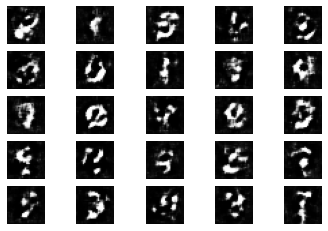

456 [D loss: 0.852163, acc.: 46.88%] [G loss: 0.928548]
457 [D loss: 0.908365, acc.: 40.62%] [G loss: 0.930809]
458 [D loss: 0.884587, acc.: 56.25%] [G loss: 1.144644]
459 [D loss: 0.525781, acc.: 65.62%] [G loss: 0.950624]
460 [D loss: 0.539298, acc.: 68.75%] [G loss: 1.057862]


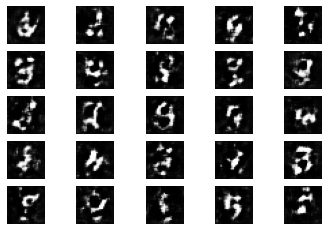

461 [D loss: 0.715331, acc.: 56.25%] [G loss: 1.066746]
462 [D loss: 0.600053, acc.: 62.50%] [G loss: 1.085538]
463 [D loss: 0.807103, acc.: 46.88%] [G loss: 0.910106]
464 [D loss: 0.732134, acc.: 65.62%] [G loss: 1.044259]
465 [D loss: 0.400562, acc.: 84.38%] [G loss: 1.487209]


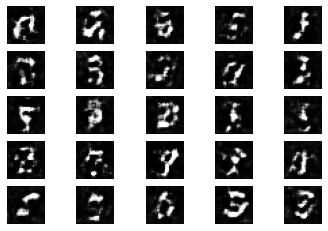

466 [D loss: 0.736275, acc.: 56.25%] [G loss: 0.779723]
467 [D loss: 0.717795, acc.: 59.38%] [G loss: 0.933465]
468 [D loss: 0.342843, acc.: 93.75%] [G loss: 1.555670]
469 [D loss: 0.660926, acc.: 71.88%] [G loss: 1.262049]
470 [D loss: 0.688440, acc.: 59.38%] [G loss: 1.120276]


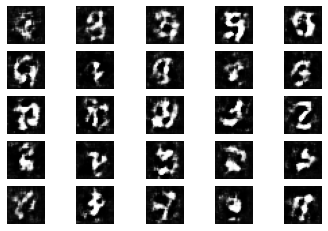

471 [D loss: 0.898192, acc.: 43.75%] [G loss: 1.107881]
472 [D loss: 0.809493, acc.: 56.25%] [G loss: 1.454270]
473 [D loss: 1.027594, acc.: 43.75%] [G loss: 1.359563]
474 [D loss: 0.998106, acc.: 34.38%] [G loss: 1.119209]
475 [D loss: 1.167562, acc.: 31.25%] [G loss: 0.813261]


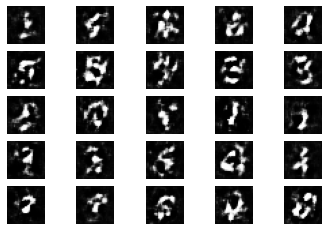

476 [D loss: 0.826913, acc.: 46.88%] [G loss: 1.175497]
477 [D loss: 0.629770, acc.: 62.50%] [G loss: 1.025715]
478 [D loss: 0.410699, acc.: 84.38%] [G loss: 1.091434]
479 [D loss: 0.787561, acc.: 56.25%] [G loss: 1.069360]
480 [D loss: 0.537049, acc.: 68.75%] [G loss: 0.997659]


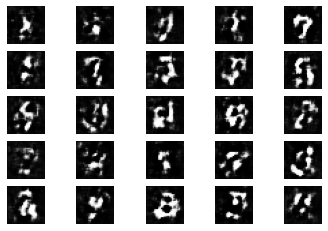

481 [D loss: 1.119143, acc.: 31.25%] [G loss: 0.803401]
482 [D loss: 0.467832, acc.: 75.00%] [G loss: 0.718270]
483 [D loss: 0.676363, acc.: 56.25%] [G loss: 1.089184]
484 [D loss: 1.233835, acc.: 18.75%] [G loss: 0.932679]
485 [D loss: 0.811365, acc.: 50.00%] [G loss: 1.213994]


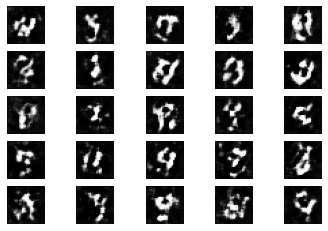

486 [D loss: 0.826288, acc.: 53.12%] [G loss: 0.955075]
487 [D loss: 0.872277, acc.: 46.88%] [G loss: 1.040495]
488 [D loss: 0.797497, acc.: 34.38%] [G loss: 1.057466]
489 [D loss: 0.583958, acc.: 65.62%] [G loss: 0.885796]
490 [D loss: 0.562493, acc.: 68.75%] [G loss: 1.128497]


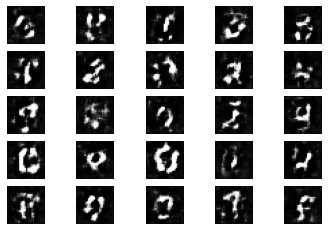

491 [D loss: 0.419203, acc.: 75.00%] [G loss: 0.879574]
492 [D loss: 0.552410, acc.: 65.62%] [G loss: 1.190506]
493 [D loss: 0.714305, acc.: 59.38%] [G loss: 0.714280]
494 [D loss: 0.917594, acc.: 40.62%] [G loss: 0.704904]
495 [D loss: 0.607903, acc.: 78.12%] [G loss: 0.788770]


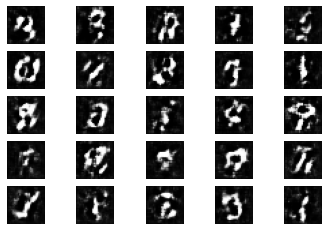

496 [D loss: 0.626195, acc.: 59.38%] [G loss: 0.863225]
497 [D loss: 0.767090, acc.: 53.12%] [G loss: 1.153123]
498 [D loss: 0.873203, acc.: 37.50%] [G loss: 1.020850]
499 [D loss: 1.204374, acc.: 25.00%] [G loss: 1.000660]
500 [D loss: 0.829333, acc.: 50.00%] [G loss: 1.424617]


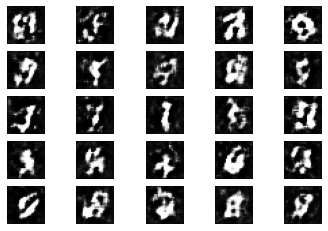

501 [D loss: 0.893628, acc.: 37.50%] [G loss: 1.180477]
502 [D loss: 0.748062, acc.: 53.12%] [G loss: 1.275986]
503 [D loss: 0.707720, acc.: 56.25%] [G loss: 1.162226]
504 [D loss: 0.884521, acc.: 43.75%] [G loss: 0.905988]
505 [D loss: 0.604134, acc.: 62.50%] [G loss: 0.847367]


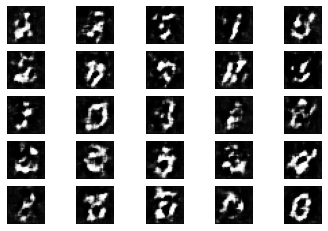

506 [D loss: 0.735973, acc.: 56.25%] [G loss: 0.895710]
507 [D loss: 0.589295, acc.: 68.75%] [G loss: 0.969878]
508 [D loss: 0.457702, acc.: 78.12%] [G loss: 1.048674]
509 [D loss: 0.547636, acc.: 75.00%] [G loss: 0.659605]
510 [D loss: 0.395336, acc.: 84.38%] [G loss: 0.695358]


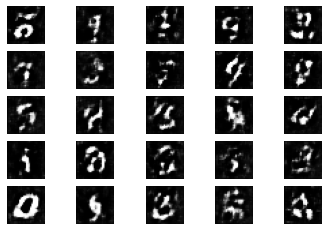

511 [D loss: 0.336291, acc.: 87.50%] [G loss: 0.878181]
512 [D loss: 0.697858, acc.: 53.12%] [G loss: 0.853525]
513 [D loss: 0.479812, acc.: 78.12%] [G loss: 1.029923]
514 [D loss: 0.647885, acc.: 62.50%] [G loss: 1.189796]
515 [D loss: 0.656043, acc.: 59.38%] [G loss: 1.237756]


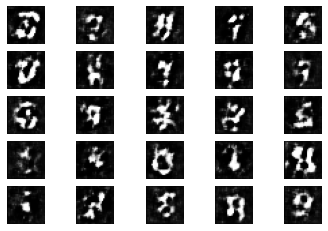

516 [D loss: 0.831002, acc.: 56.25%] [G loss: 0.924610]
517 [D loss: 0.527833, acc.: 71.88%] [G loss: 0.994487]
518 [D loss: 0.890725, acc.: 46.88%] [G loss: 1.082665]
519 [D loss: 0.819435, acc.: 50.00%] [G loss: 1.104550]
520 [D loss: 0.514121, acc.: 71.88%] [G loss: 1.330388]


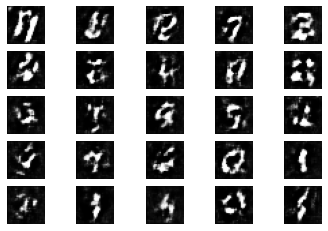

521 [D loss: 0.576867, acc.: 62.50%] [G loss: 0.906839]
522 [D loss: 0.699264, acc.: 59.38%] [G loss: 0.807237]
523 [D loss: 0.651715, acc.: 59.38%] [G loss: 1.004172]
524 [D loss: 0.441415, acc.: 78.12%] [G loss: 1.064376]
525 [D loss: 0.495355, acc.: 68.75%] [G loss: 1.209350]


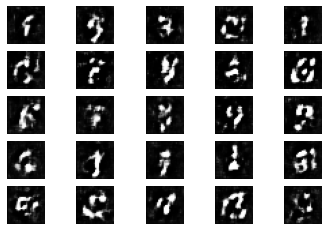

526 [D loss: 0.532176, acc.: 81.25%] [G loss: 1.113761]
527 [D loss: 0.869546, acc.: 46.88%] [G loss: 1.003091]
528 [D loss: 0.690491, acc.: 56.25%] [G loss: 1.099652]
529 [D loss: 0.716974, acc.: 59.38%] [G loss: 0.972601]
530 [D loss: 0.671023, acc.: 53.12%] [G loss: 1.225312]


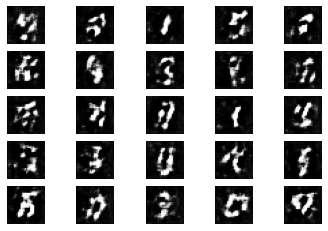

531 [D loss: 0.535752, acc.: 68.75%] [G loss: 0.874425]
532 [D loss: 0.483151, acc.: 78.12%] [G loss: 1.138438]
533 [D loss: 0.895248, acc.: 46.88%] [G loss: 0.737693]
534 [D loss: 0.870939, acc.: 59.38%] [G loss: 1.196448]
535 [D loss: 0.940017, acc.: 40.62%] [G loss: 1.290173]


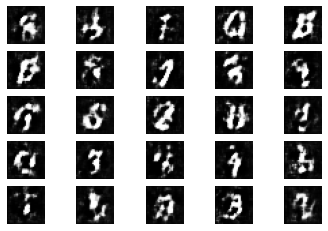

536 [D loss: 0.817436, acc.: 56.25%] [G loss: 1.288733]
537 [D loss: 0.884769, acc.: 37.50%] [G loss: 1.028878]
538 [D loss: 0.835883, acc.: 50.00%] [G loss: 1.026873]
539 [D loss: 0.822629, acc.: 50.00%] [G loss: 0.793850]
540 [D loss: 0.656355, acc.: 56.25%] [G loss: 1.054773]


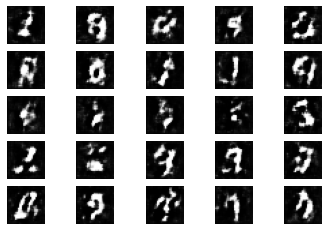

541 [D loss: 0.908803, acc.: 43.75%] [G loss: 0.954727]
542 [D loss: 0.620737, acc.: 62.50%] [G loss: 1.406851]
543 [D loss: 0.777074, acc.: 56.25%] [G loss: 0.981140]
544 [D loss: 0.757427, acc.: 59.38%] [G loss: 0.961381]
545 [D loss: 0.542631, acc.: 65.62%] [G loss: 0.974129]


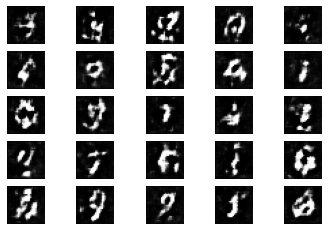

546 [D loss: 0.610393, acc.: 62.50%] [G loss: 0.893340]
547 [D loss: 0.612000, acc.: 62.50%] [G loss: 1.076648]
548 [D loss: 0.617402, acc.: 62.50%] [G loss: 0.975072]
549 [D loss: 0.596590, acc.: 68.75%] [G loss: 0.965806]
550 [D loss: 0.565225, acc.: 75.00%] [G loss: 1.188740]


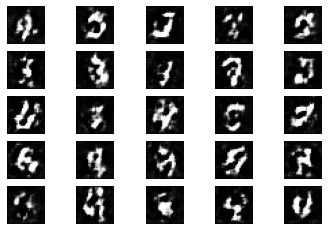

551 [D loss: 0.652603, acc.: 59.38%] [G loss: 1.034017]
552 [D loss: 0.324940, acc.: 90.62%] [G loss: 1.218300]
553 [D loss: 1.053975, acc.: 37.50%] [G loss: 0.906180]
554 [D loss: 0.539236, acc.: 65.62%] [G loss: 0.945316]
555 [D loss: 0.489300, acc.: 75.00%] [G loss: 1.124360]


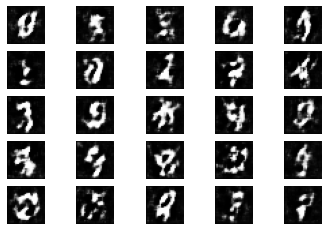

556 [D loss: 0.653600, acc.: 53.12%] [G loss: 1.238328]
557 [D loss: 0.948669, acc.: 43.75%] [G loss: 1.128428]
558 [D loss: 0.891518, acc.: 46.88%] [G loss: 0.876308]
559 [D loss: 0.896370, acc.: 50.00%] [G loss: 0.979150]
560 [D loss: 0.684412, acc.: 62.50%] [G loss: 1.030376]


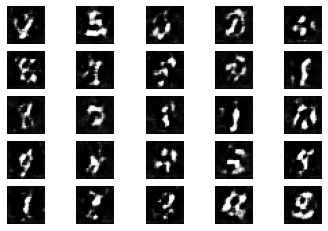

561 [D loss: 0.752861, acc.: 53.12%] [G loss: 0.782045]
562 [D loss: 0.208331, acc.: 96.88%] [G loss: 0.791349]
563 [D loss: 0.502360, acc.: 75.00%] [G loss: 0.914629]
564 [D loss: 0.292216, acc.: 90.62%] [G loss: 1.023235]
565 [D loss: 0.613565, acc.: 75.00%] [G loss: 0.825051]


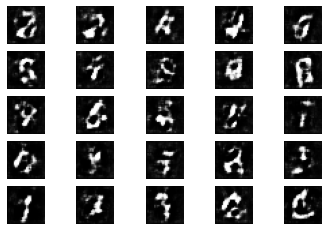

566 [D loss: 0.527611, acc.: 65.62%] [G loss: 1.040531]
567 [D loss: 0.497630, acc.: 78.12%] [G loss: 1.050244]
568 [D loss: 0.677994, acc.: 53.12%] [G loss: 0.917632]
569 [D loss: 0.460795, acc.: 84.38%] [G loss: 1.378247]
570 [D loss: 0.601212, acc.: 75.00%] [G loss: 0.973025]


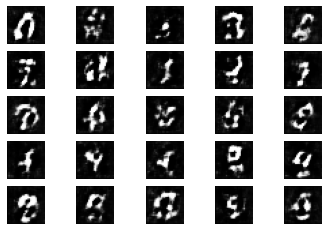

571 [D loss: 0.471628, acc.: 78.12%] [G loss: 1.089824]
572 [D loss: 0.421469, acc.: 87.50%] [G loss: 1.138484]
573 [D loss: 0.606098, acc.: 62.50%] [G loss: 1.441869]
574 [D loss: 0.317089, acc.: 93.75%] [G loss: 1.376751]
575 [D loss: 0.727974, acc.: 62.50%] [G loss: 0.893187]


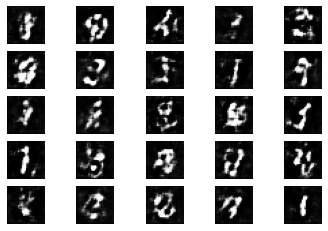

576 [D loss: 0.666675, acc.: 65.62%] [G loss: 0.922116]
577 [D loss: 0.953183, acc.: 43.75%] [G loss: 0.931010]
578 [D loss: 0.527783, acc.: 71.88%] [G loss: 1.063968]
579 [D loss: 0.719826, acc.: 65.62%] [G loss: 0.976998]
580 [D loss: 0.858239, acc.: 46.88%] [G loss: 1.292330]


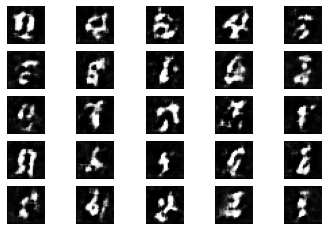

581 [D loss: 0.829248, acc.: 50.00%] [G loss: 1.112155]
582 [D loss: 0.655848, acc.: 65.62%] [G loss: 1.272550]
583 [D loss: 0.780304, acc.: 56.25%] [G loss: 0.997692]
584 [D loss: 0.248575, acc.: 96.88%] [G loss: 0.840809]
585 [D loss: 0.685604, acc.: 65.62%] [G loss: 0.939057]


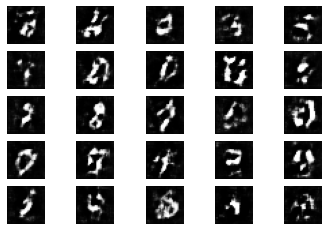

586 [D loss: 0.690803, acc.: 56.25%] [G loss: 1.214286]
587 [D loss: 0.721311, acc.: 53.12%] [G loss: 1.279542]
588 [D loss: 0.411705, acc.: 81.25%] [G loss: 1.161736]
589 [D loss: 0.379238, acc.: 90.62%] [G loss: 0.958501]
590 [D loss: 0.340933, acc.: 90.62%] [G loss: 1.010190]


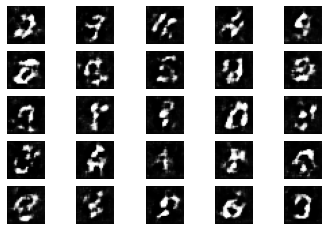

591 [D loss: 0.501425, acc.: 71.88%] [G loss: 0.917331]
592 [D loss: 0.344877, acc.: 84.38%] [G loss: 0.882455]
593 [D loss: 0.492895, acc.: 71.88%] [G loss: 1.071856]
594 [D loss: 0.854322, acc.: 46.88%] [G loss: 0.901152]
595 [D loss: 0.874018, acc.: 46.88%] [G loss: 1.284341]


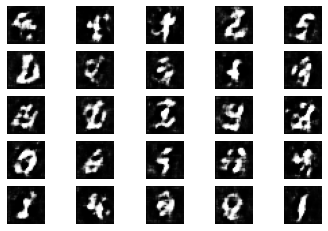

596 [D loss: 0.899845, acc.: 53.12%] [G loss: 1.393469]
597 [D loss: 0.915180, acc.: 43.75%] [G loss: 1.392710]
598 [D loss: 0.980027, acc.: 25.00%] [G loss: 1.142006]
599 [D loss: 0.423879, acc.: 84.38%] [G loss: 1.158499]
600 [D loss: 0.661044, acc.: 62.50%] [G loss: 1.216037]


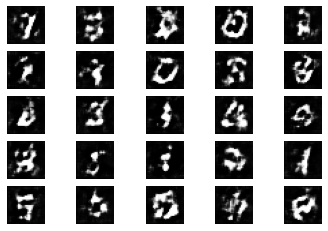

601 [D loss: 0.751755, acc.: 65.62%] [G loss: 0.904562]
602 [D loss: 0.941493, acc.: 37.50%] [G loss: 0.950963]
603 [D loss: 0.398861, acc.: 84.38%] [G loss: 0.973183]
604 [D loss: 0.591742, acc.: 59.38%] [G loss: 0.765339]
605 [D loss: 0.410167, acc.: 87.50%] [G loss: 0.894215]


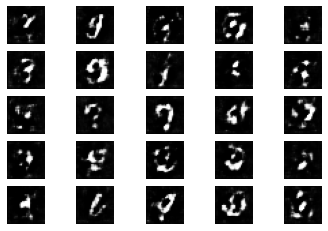

606 [D loss: 0.170151, acc.: 96.88%] [G loss: 0.779452]
607 [D loss: 0.242682, acc.: 87.50%] [G loss: 1.015918]
608 [D loss: 0.498006, acc.: 71.88%] [G loss: 0.789878]
609 [D loss: 0.297617, acc.: 81.25%] [G loss: 0.898053]
610 [D loss: 0.267667, acc.: 87.50%] [G loss: 1.138429]


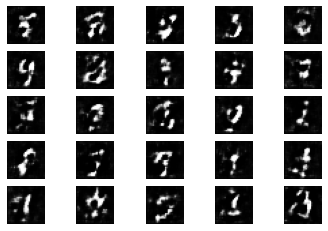

611 [D loss: 0.273938, acc.: 93.75%] [G loss: 1.228651]
612 [D loss: 0.580171, acc.: 65.62%] [G loss: 0.962138]
613 [D loss: 0.641111, acc.: 65.62%] [G loss: 1.143689]
614 [D loss: 0.919920, acc.: 53.12%] [G loss: 1.403486]
615 [D loss: 0.700766, acc.: 56.25%] [G loss: 1.047477]


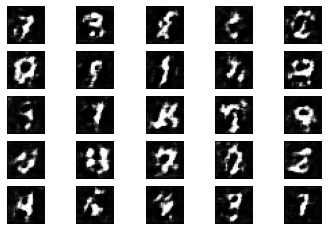

616 [D loss: 0.614193, acc.: 65.62%] [G loss: 1.291702]
617 [D loss: 1.013409, acc.: 59.38%] [G loss: 1.131872]
618 [D loss: 0.431336, acc.: 71.88%] [G loss: 1.152228]
619 [D loss: 0.328081, acc.: 90.62%] [G loss: 0.895416]
620 [D loss: 0.560018, acc.: 75.00%] [G loss: 1.081352]


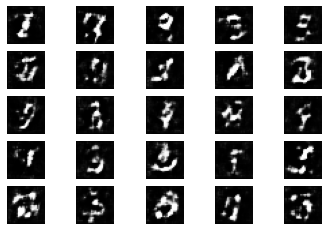

621 [D loss: 0.339635, acc.: 93.75%] [G loss: 1.056743]
622 [D loss: 0.612117, acc.: 71.88%] [G loss: 1.310001]
623 [D loss: 0.473941, acc.: 78.12%] [G loss: 1.264443]
624 [D loss: 0.290170, acc.: 93.75%] [G loss: 0.842276]
625 [D loss: 0.726918, acc.: 65.62%] [G loss: 1.040246]


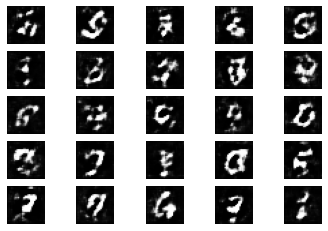

626 [D loss: 0.332823, acc.: 93.75%] [G loss: 1.441103]
627 [D loss: 0.841971, acc.: 53.12%] [G loss: 0.923533]
628 [D loss: 0.582756, acc.: 75.00%] [G loss: 0.982784]
629 [D loss: 0.918943, acc.: 34.38%] [G loss: 0.973360]
630 [D loss: 0.257967, acc.: 87.50%] [G loss: 0.848474]


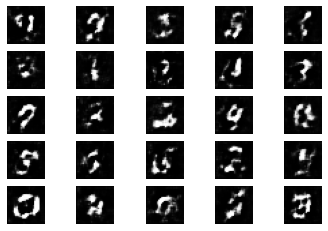

631 [D loss: 0.363831, acc.: 90.62%] [G loss: 1.042866]
632 [D loss: 0.549446, acc.: 71.88%] [G loss: 0.924054]
633 [D loss: 0.302399, acc.: 90.62%] [G loss: 0.998147]
634 [D loss: 0.226849, acc.: 93.75%] [G loss: 1.078419]
635 [D loss: 0.257270, acc.: 93.75%] [G loss: 0.965097]


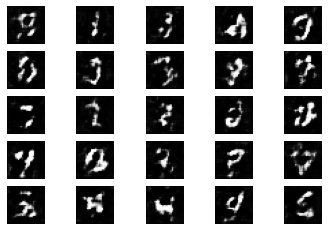

636 [D loss: 0.252788, acc.: 93.75%] [G loss: 0.773926]
637 [D loss: 0.346190, acc.: 84.38%] [G loss: 1.146290]
638 [D loss: 0.378919, acc.: 81.25%] [G loss: 0.877254]
639 [D loss: 0.152401, acc.: 96.88%] [G loss: 1.172924]
640 [D loss: 1.014876, acc.: 37.50%] [G loss: 0.850087]


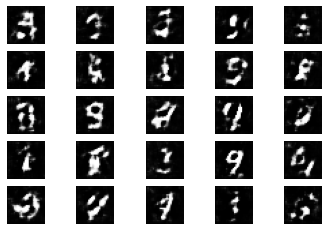

641 [D loss: 0.547765, acc.: 78.12%] [G loss: 0.644785]
642 [D loss: 0.923239, acc.: 50.00%] [G loss: 0.879249]
643 [D loss: 0.616653, acc.: 62.50%] [G loss: 0.989924]
644 [D loss: 0.933047, acc.: 40.62%] [G loss: 1.083438]
645 [D loss: 0.484983, acc.: 75.00%] [G loss: 1.045983]


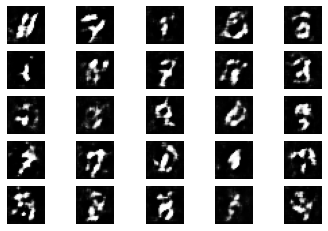

646 [D loss: 0.289611, acc.: 93.75%] [G loss: 1.098144]
647 [D loss: 0.411731, acc.: 78.12%] [G loss: 0.910769]
648 [D loss: 0.582574, acc.: 59.38%] [G loss: 1.033403]
649 [D loss: 0.690257, acc.: 65.62%] [G loss: 1.018940]
650 [D loss: 0.419568, acc.: 81.25%] [G loss: 1.106976]


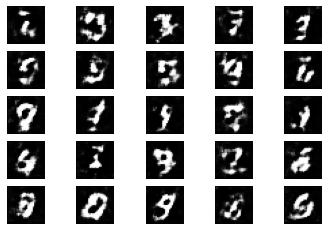

651 [D loss: 0.820992, acc.: 53.12%] [G loss: 0.803975]
652 [D loss: 0.429016, acc.: 75.00%] [G loss: 0.960670]
653 [D loss: 1.501007, acc.: 18.75%] [G loss: 0.947341]
654 [D loss: 0.753583, acc.: 53.12%] [G loss: 0.792912]
655 [D loss: 0.700476, acc.: 65.62%] [G loss: 0.934422]


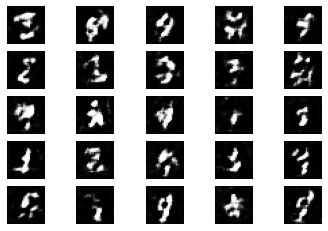

656 [D loss: 0.818087, acc.: 43.75%] [G loss: 0.834956]
657 [D loss: 0.528370, acc.: 78.12%] [G loss: 0.924258]
658 [D loss: 0.456230, acc.: 81.25%] [G loss: 0.847154]
659 [D loss: 0.493056, acc.: 75.00%] [G loss: 1.083287]
660 [D loss: 0.217813, acc.: 96.88%] [G loss: 1.089606]


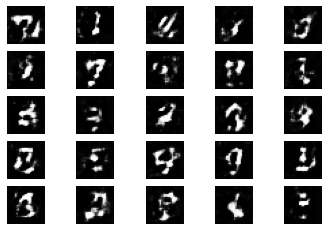

661 [D loss: 0.151298, acc.: 100.00%] [G loss: 0.925284]
662 [D loss: 0.100164, acc.: 100.00%] [G loss: 1.037738]
663 [D loss: 0.195463, acc.: 100.00%] [G loss: 0.746083]
664 [D loss: 0.431170, acc.: 84.38%] [G loss: 0.895726]
665 [D loss: 0.519495, acc.: 71.88%] [G loss: 1.155389]


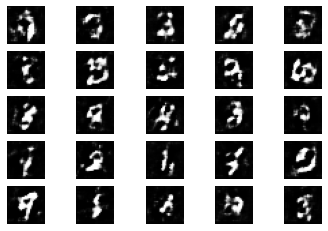

666 [D loss: 0.959511, acc.: 50.00%] [G loss: 0.830508]
667 [D loss: 0.282326, acc.: 96.88%] [G loss: 0.902614]
668 [D loss: 0.966650, acc.: 40.62%] [G loss: 0.953722]
669 [D loss: 0.449011, acc.: 84.38%] [G loss: 0.930700]
670 [D loss: 0.577988, acc.: 71.88%] [G loss: 1.092031]


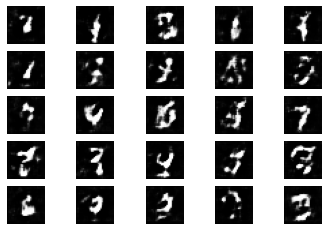

671 [D loss: 0.216199, acc.: 100.00%] [G loss: 1.227743]
672 [D loss: 0.433590, acc.: 75.00%] [G loss: 0.801190]
673 [D loss: 1.139731, acc.: 37.50%] [G loss: 0.885137]
674 [D loss: 0.324317, acc.: 84.38%] [G loss: 1.078804]
675 [D loss: 0.652522, acc.: 62.50%] [G loss: 1.162624]


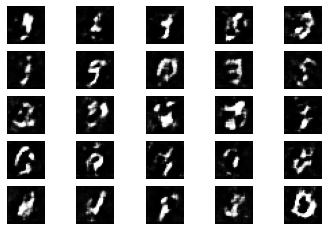

676 [D loss: 0.720972, acc.: 65.62%] [G loss: 0.981326]
677 [D loss: 0.313037, acc.: 90.62%] [G loss: 1.232666]
678 [D loss: 0.207465, acc.: 96.88%] [G loss: 0.987024]
679 [D loss: 0.243335, acc.: 93.75%] [G loss: 0.956809]
680 [D loss: 0.311877, acc.: 87.50%] [G loss: 1.055392]


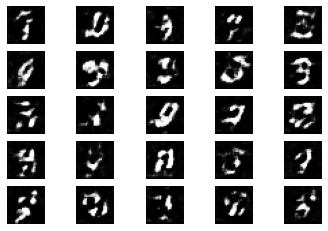

681 [D loss: 0.518890, acc.: 71.88%] [G loss: 1.109560]
682 [D loss: 0.334141, acc.: 93.75%] [G loss: 1.083505]
683 [D loss: 0.372506, acc.: 84.38%] [G loss: 1.136458]
684 [D loss: 0.754089, acc.: 62.50%] [G loss: 0.792344]
685 [D loss: 0.333991, acc.: 90.62%] [G loss: 1.117685]


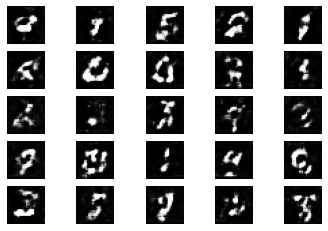

686 [D loss: 0.234887, acc.: 90.62%] [G loss: 1.228077]
687 [D loss: 0.448220, acc.: 81.25%] [G loss: 1.249849]
688 [D loss: 0.126743, acc.: 96.88%] [G loss: 0.735891]
689 [D loss: 0.082275, acc.: 100.00%] [G loss: 0.997616]
690 [D loss: 0.166958, acc.: 96.88%] [G loss: 0.886051]


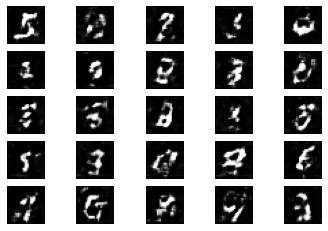

691 [D loss: 0.143737, acc.: 100.00%] [G loss: 0.934354]
692 [D loss: 0.356620, acc.: 84.38%] [G loss: 0.905917]
693 [D loss: 0.157058, acc.: 100.00%] [G loss: 1.121814]
694 [D loss: 0.115469, acc.: 100.00%] [G loss: 1.135971]
695 [D loss: 0.514707, acc.: 78.12%] [G loss: 0.958040]


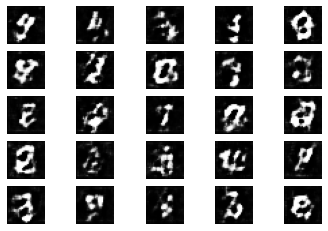

696 [D loss: 0.339243, acc.: 90.62%] [G loss: 1.322195]
697 [D loss: 0.169588, acc.: 100.00%] [G loss: 1.023560]
698 [D loss: 0.207256, acc.: 100.00%] [G loss: 1.193527]
699 [D loss: 0.383629, acc.: 78.12%] [G loss: 0.972361]
700 [D loss: 0.414527, acc.: 84.38%] [G loss: 0.778639]


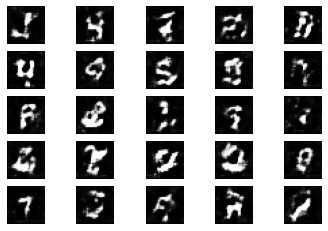

701 [D loss: 0.539281, acc.: 75.00%] [G loss: 1.092750]
702 [D loss: 0.324136, acc.: 87.50%] [G loss: 1.050752]
703 [D loss: 0.241198, acc.: 93.75%] [G loss: 0.836486]
704 [D loss: 0.574150, acc.: 62.50%] [G loss: 0.659914]
705 [D loss: 0.429101, acc.: 78.12%] [G loss: 0.954212]


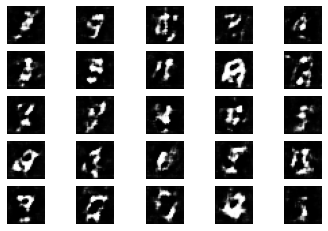

706 [D loss: 1.420105, acc.: 25.00%] [G loss: 1.005591]
707 [D loss: 0.245562, acc.: 93.75%] [G loss: 0.877475]
708 [D loss: 0.159292, acc.: 93.75%] [G loss: 0.912213]
709 [D loss: 0.634381, acc.: 65.62%] [G loss: 0.815009]
710 [D loss: 0.281069, acc.: 90.62%] [G loss: 0.902854]


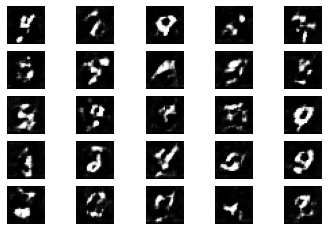

711 [D loss: 0.572995, acc.: 62.50%] [G loss: 0.619891]
712 [D loss: 0.298427, acc.: 90.62%] [G loss: 0.851391]
713 [D loss: 0.417161, acc.: 84.38%] [G loss: 0.771963]
714 [D loss: 0.635360, acc.: 59.38%] [G loss: 0.681774]
715 [D loss: 0.066422, acc.: 100.00%] [G loss: 1.009764]


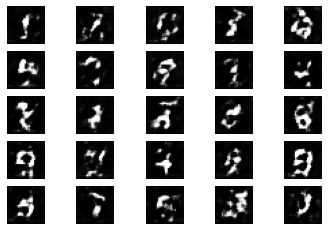

716 [D loss: 0.111352, acc.: 100.00%] [G loss: 1.063053]
717 [D loss: 0.532248, acc.: 71.88%] [G loss: 0.899917]
718 [D loss: 0.251362, acc.: 84.38%] [G loss: 0.994278]
719 [D loss: 0.656267, acc.: 65.62%] [G loss: 0.912284]
720 [D loss: 0.073469, acc.: 100.00%] [G loss: 1.030385]


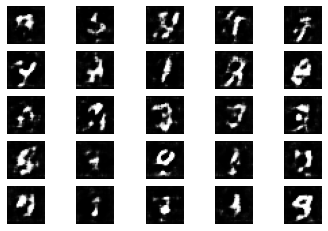

721 [D loss: 1.277031, acc.: 34.38%] [G loss: 0.987229]
722 [D loss: 0.201988, acc.: 93.75%] [G loss: 0.852484]
723 [D loss: 0.186632, acc.: 96.88%] [G loss: 0.762059]
724 [D loss: 0.454638, acc.: 71.88%] [G loss: 0.795855]
725 [D loss: 0.123167, acc.: 100.00%] [G loss: 1.195275]


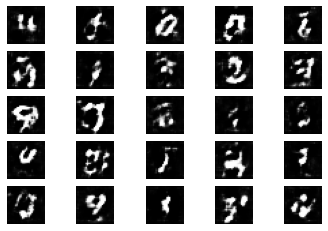

726 [D loss: 0.184521, acc.: 96.88%] [G loss: 0.959301]
727 [D loss: 0.262053, acc.: 90.62%] [G loss: 0.966042]
728 [D loss: 0.073653, acc.: 100.00%] [G loss: 1.235845]
729 [D loss: 0.124165, acc.: 100.00%] [G loss: 1.000899]
730 [D loss: 0.077438, acc.: 100.00%] [G loss: 1.014359]


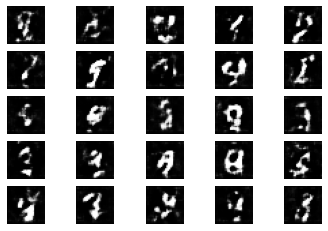

731 [D loss: 0.301995, acc.: 87.50%] [G loss: 0.796082]
732 [D loss: 1.313635, acc.: 28.12%] [G loss: 1.043485]
733 [D loss: 0.160456, acc.: 100.00%] [G loss: 0.802217]
734 [D loss: 0.096756, acc.: 96.88%] [G loss: 0.810108]
735 [D loss: 0.056046, acc.: 100.00%] [G loss: 1.013884]


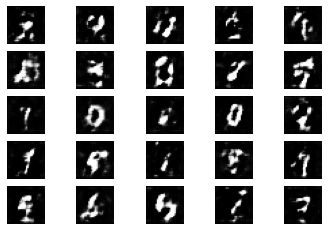

736 [D loss: 0.252380, acc.: 90.62%] [G loss: 0.796414]
737 [D loss: 0.150881, acc.: 93.75%] [G loss: 0.957489]
738 [D loss: 0.343644, acc.: 84.38%] [G loss: 1.118720]
739 [D loss: 0.370223, acc.: 78.12%] [G loss: 0.751083]
740 [D loss: 0.310890, acc.: 84.38%] [G loss: 0.710501]


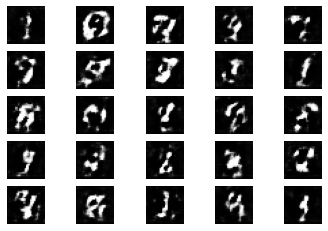

741 [D loss: 0.358594, acc.: 90.62%] [G loss: 0.747683]
742 [D loss: 0.229437, acc.: 93.75%] [G loss: 1.174482]
743 [D loss: 0.196105, acc.: 96.88%] [G loss: 1.129167]
744 [D loss: 0.370207, acc.: 84.38%] [G loss: 0.909675]
745 [D loss: 0.422055, acc.: 87.50%] [G loss: 1.317347]


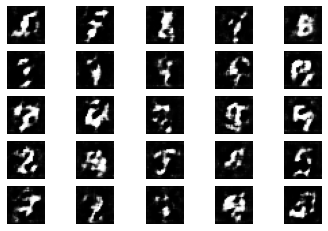

746 [D loss: 1.161402, acc.: 37.50%] [G loss: 1.085956]
747 [D loss: 0.662686, acc.: 71.88%] [G loss: 0.872035]
748 [D loss: 0.284099, acc.: 84.38%] [G loss: 1.457560]
749 [D loss: 0.522742, acc.: 81.25%] [G loss: 1.486949]
750 [D loss: 0.741221, acc.: 50.00%] [G loss: 0.846622]


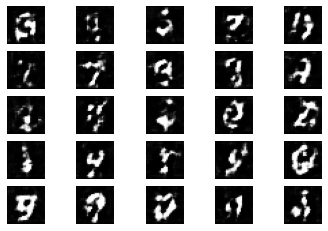

751 [D loss: 0.275281, acc.: 90.62%] [G loss: 0.738168]
752 [D loss: 0.132756, acc.: 100.00%] [G loss: 0.795903]
753 [D loss: 0.172105, acc.: 100.00%] [G loss: 0.882931]
754 [D loss: 0.337512, acc.: 87.50%] [G loss: 0.904383]
755 [D loss: 0.278172, acc.: 87.50%] [G loss: 1.064372]


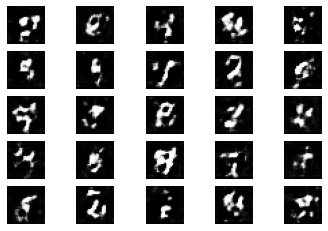

756 [D loss: 0.134653, acc.: 100.00%] [G loss: 0.937730]
757 [D loss: 0.415323, acc.: 84.38%] [G loss: 0.938811]
758 [D loss: 0.159152, acc.: 96.88%] [G loss: 1.108050]
759 [D loss: 0.683625, acc.: 65.62%] [G loss: 0.753873]
760 [D loss: 0.052959, acc.: 100.00%] [G loss: 1.011360]


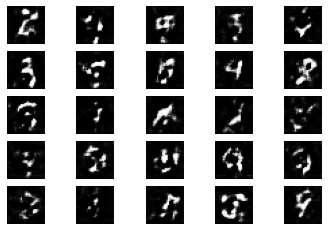

761 [D loss: 0.044902, acc.: 100.00%] [G loss: 1.125563]
762 [D loss: 0.029412, acc.: 100.00%] [G loss: 0.894135]
763 [D loss: 0.100354, acc.: 96.88%] [G loss: 0.989536]
764 [D loss: 0.027168, acc.: 100.00%] [G loss: 0.937460]
765 [D loss: 0.182382, acc.: 96.88%] [G loss: 0.871444]


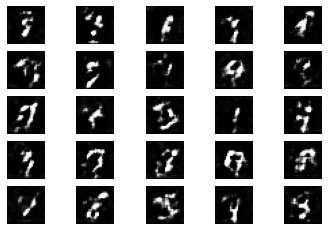

766 [D loss: 0.187454, acc.: 93.75%] [G loss: 0.833445]
767 [D loss: 0.040975, acc.: 100.00%] [G loss: 0.985226]
768 [D loss: 0.013465, acc.: 100.00%] [G loss: 0.683391]
769 [D loss: 0.618720, acc.: 59.38%] [G loss: 0.770537]
770 [D loss: 0.073509, acc.: 100.00%] [G loss: 0.674310]


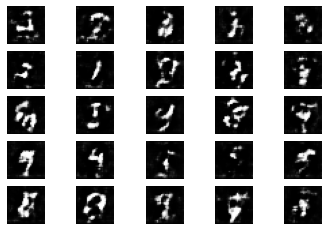

771 [D loss: 0.905753, acc.: 50.00%] [G loss: 0.355910]
772 [D loss: 0.176465, acc.: 96.88%] [G loss: 0.769702]
773 [D loss: 0.113979, acc.: 96.88%] [G loss: 0.868051]
774 [D loss: 0.081949, acc.: 100.00%] [G loss: 1.106029]
775 [D loss: 0.167595, acc.: 93.75%] [G loss: 1.128655]


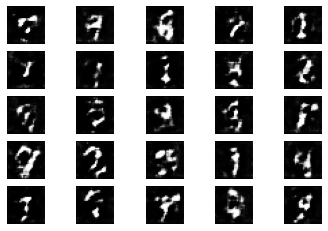

776 [D loss: 0.121410, acc.: 93.75%] [G loss: 0.855725]
777 [D loss: 0.080504, acc.: 100.00%] [G loss: 0.943212]
778 [D loss: 0.251739, acc.: 90.62%] [G loss: 1.250071]
779 [D loss: 0.086293, acc.: 100.00%] [G loss: 0.988361]
780 [D loss: 0.725750, acc.: 56.25%] [G loss: 0.647337]


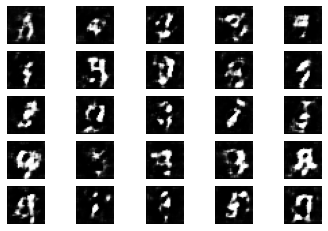

781 [D loss: 0.147741, acc.: 96.88%] [G loss: 1.279662]
782 [D loss: 0.372196, acc.: 81.25%] [G loss: 1.143841]
783 [D loss: 0.965863, acc.: 34.38%] [G loss: 0.616215]
784 [D loss: 0.242096, acc.: 87.50%] [G loss: 0.668874]
785 [D loss: 0.932360, acc.: 43.75%] [G loss: 0.944990]


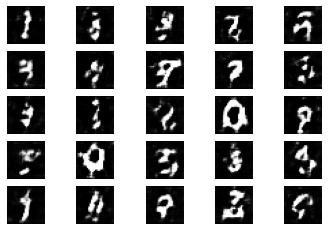

786 [D loss: 0.172148, acc.: 93.75%] [G loss: 1.204222]
787 [D loss: 0.065055, acc.: 100.00%] [G loss: 1.114599]
788 [D loss: 0.439383, acc.: 71.88%] [G loss: 1.188174]
789 [D loss: 0.241365, acc.: 96.88%] [G loss: 0.893136]
790 [D loss: 0.253349, acc.: 96.88%] [G loss: 0.985403]


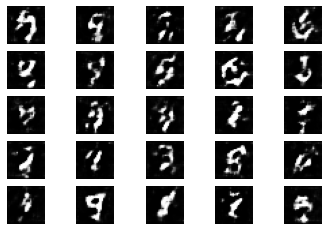

791 [D loss: 0.194757, acc.: 93.75%] [G loss: 1.262022]
792 [D loss: 0.108704, acc.: 100.00%] [G loss: 1.064968]
793 [D loss: 0.295529, acc.: 90.62%] [G loss: 0.808604]
794 [D loss: 0.045692, acc.: 100.00%] [G loss: 0.981736]
795 [D loss: 0.219034, acc.: 93.75%] [G loss: 1.107131]


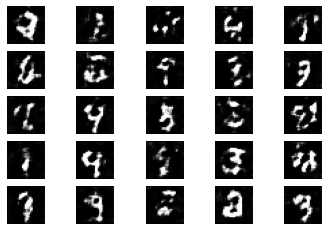

796 [D loss: 0.435506, acc.: 81.25%] [G loss: 0.905696]
797 [D loss: 0.883526, acc.: 46.88%] [G loss: 0.716370]
798 [D loss: 0.188552, acc.: 96.88%] [G loss: 1.076951]
799 [D loss: 0.466531, acc.: 75.00%] [G loss: 0.682237]
800 [D loss: 0.211607, acc.: 93.75%] [G loss: 1.129954]


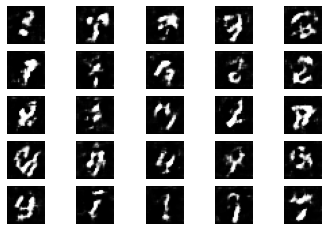

801 [D loss: 0.141151, acc.: 100.00%] [G loss: 0.973945]
802 [D loss: 0.070611, acc.: 100.00%] [G loss: 0.945984]
803 [D loss: 0.130902, acc.: 96.88%] [G loss: 0.905849]
804 [D loss: 0.101263, acc.: 100.00%] [G loss: 0.990205]
805 [D loss: 1.108119, acc.: 50.00%] [G loss: 0.928637]


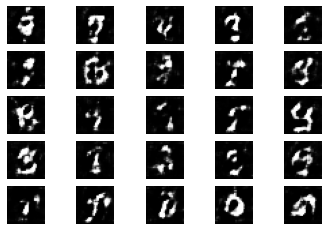

806 [D loss: 0.726171, acc.: 62.50%] [G loss: 0.995191]
807 [D loss: 0.482051, acc.: 75.00%] [G loss: 0.901551]
808 [D loss: 1.388634, acc.: 46.88%] [G loss: 0.898130]
809 [D loss: 0.100351, acc.: 100.00%] [G loss: 1.192053]
810 [D loss: 0.598638, acc.: 65.62%] [G loss: 1.089411]


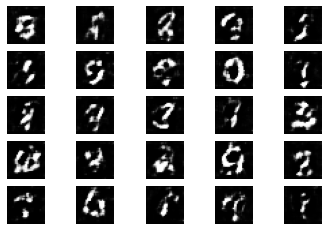

811 [D loss: 0.036542, acc.: 100.00%] [G loss: 1.007110]
812 [D loss: 0.151370, acc.: 93.75%] [G loss: 1.156891]
813 [D loss: 0.013887, acc.: 100.00%] [G loss: 1.283993]
814 [D loss: 0.135891, acc.: 96.88%] [G loss: 1.285214]
815 [D loss: 0.009885, acc.: 100.00%] [G loss: 1.501333]


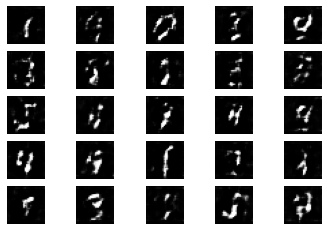

816 [D loss: 0.051148, acc.: 100.00%] [G loss: 1.037165]
817 [D loss: 0.034182, acc.: 100.00%] [G loss: 1.569893]
818 [D loss: 0.034717, acc.: 100.00%] [G loss: 1.506427]
819 [D loss: 0.066278, acc.: 100.00%] [G loss: 1.342877]
820 [D loss: 0.015371, acc.: 100.00%] [G loss: 1.179223]


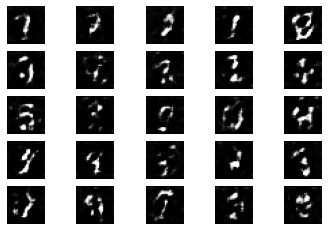

821 [D loss: 0.059305, acc.: 100.00%] [G loss: 1.074415]
822 [D loss: 0.027391, acc.: 100.00%] [G loss: 0.608485]
823 [D loss: 0.608689, acc.: 68.75%] [G loss: 0.609234]
824 [D loss: 0.017513, acc.: 100.00%] [G loss: 0.952633]
825 [D loss: 0.139492, acc.: 93.75%] [G loss: 1.196212]


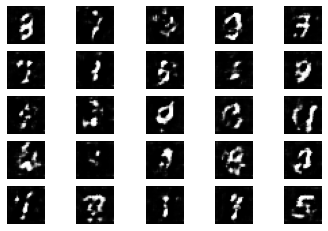

826 [D loss: 0.599492, acc.: 62.50%] [G loss: 0.924123]
827 [D loss: 0.096343, acc.: 100.00%] [G loss: 0.697113]
828 [D loss: 0.017509, acc.: 100.00%] [G loss: 0.623373]
829 [D loss: 0.193221, acc.: 87.50%] [G loss: 0.794392]
830 [D loss: 0.014444, acc.: 100.00%] [G loss: 0.398210]


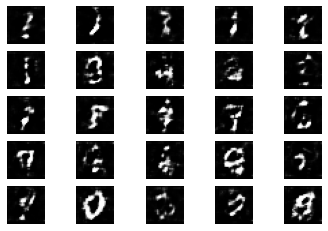

831 [D loss: 0.148029, acc.: 96.88%] [G loss: 0.495447]
832 [D loss: 0.049430, acc.: 100.00%] [G loss: 1.148127]
833 [D loss: 0.356370, acc.: 87.50%] [G loss: 1.335115]
834 [D loss: 0.079162, acc.: 100.00%] [G loss: 1.259931]
835 [D loss: 0.079675, acc.: 100.00%] [G loss: 0.692510]


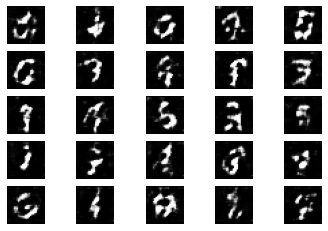

836 [D loss: 0.203415, acc.: 93.75%] [G loss: 1.216518]
837 [D loss: 0.175281, acc.: 100.00%] [G loss: 0.704731]
838 [D loss: 0.540099, acc.: 75.00%] [G loss: 0.968914]
839 [D loss: 0.466979, acc.: 75.00%] [G loss: 1.100837]
840 [D loss: 0.103260, acc.: 96.88%] [G loss: 1.199791]


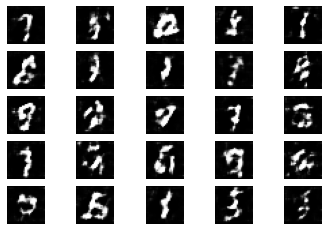

841 [D loss: 0.623230, acc.: 65.62%] [G loss: 0.976123]
842 [D loss: 0.113684, acc.: 100.00%] [G loss: 1.433029]
843 [D loss: 0.433393, acc.: 71.88%] [G loss: 1.236078]
844 [D loss: 0.618456, acc.: 81.25%] [G loss: 1.153875]
845 [D loss: 0.134610, acc.: 96.88%] [G loss: 0.771385]


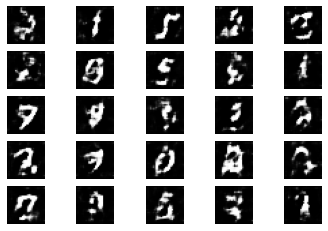

846 [D loss: 0.100326, acc.: 100.00%] [G loss: 0.716352]
847 [D loss: 0.164912, acc.: 100.00%] [G loss: 0.811836]
848 [D loss: 0.319312, acc.: 84.38%] [G loss: 0.870864]
849 [D loss: 0.203627, acc.: 93.75%] [G loss: 0.849011]
850 [D loss: 1.442175, acc.: 28.12%] [G loss: 0.821320]


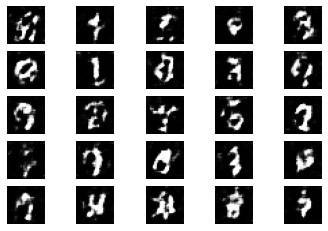

851 [D loss: 0.072035, acc.: 100.00%] [G loss: 1.199098]
852 [D loss: 0.138056, acc.: 96.88%] [G loss: 1.502145]
853 [D loss: 0.282236, acc.: 90.62%] [G loss: 1.399191]
854 [D loss: 0.269781, acc.: 84.38%] [G loss: 1.401708]
855 [D loss: 0.376548, acc.: 84.38%] [G loss: 0.760216]


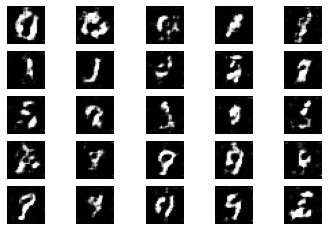

856 [D loss: 0.112934, acc.: 96.88%] [G loss: 1.369996]
857 [D loss: 0.084993, acc.: 100.00%] [G loss: 1.673267]
858 [D loss: 0.061432, acc.: 100.00%] [G loss: 2.353511]
859 [D loss: 0.019495, acc.: 100.00%] [G loss: 1.959835]
860 [D loss: 0.016977, acc.: 100.00%] [G loss: 1.289970]


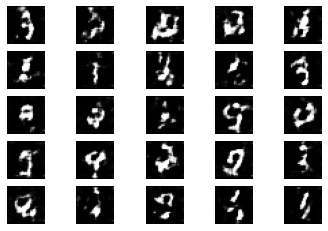

861 [D loss: 0.091414, acc.: 96.88%] [G loss: 1.572243]
862 [D loss: 0.013081, acc.: 100.00%] [G loss: 1.186617]
863 [D loss: 0.458502, acc.: 68.75%] [G loss: 0.910228]
864 [D loss: 0.546908, acc.: 68.75%] [G loss: 1.056758]
865 [D loss: 0.069090, acc.: 96.88%] [G loss: 1.377899]


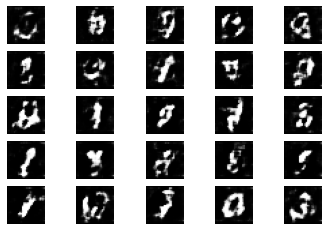

866 [D loss: 0.147529, acc.: 93.75%] [G loss: 1.448190]
867 [D loss: 1.638196, acc.: 37.50%] [G loss: 1.396356]
868 [D loss: 0.015231, acc.: 100.00%] [G loss: 0.935988]
869 [D loss: 1.348440, acc.: 50.00%] [G loss: 0.940313]
870 [D loss: 0.239142, acc.: 93.75%] [G loss: 1.134731]


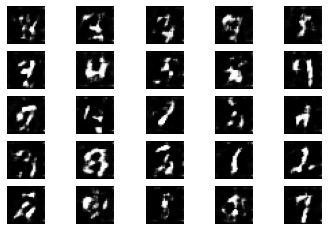

871 [D loss: 0.116373, acc.: 100.00%] [G loss: 1.502720]
872 [D loss: 0.104753, acc.: 100.00%] [G loss: 2.027990]
873 [D loss: 0.279375, acc.: 93.75%] [G loss: 1.301196]
874 [D loss: 0.025939, acc.: 100.00%] [G loss: 1.051407]
875 [D loss: 0.199601, acc.: 93.75%] [G loss: 1.410653]


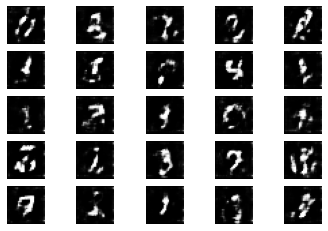

876 [D loss: 0.022731, acc.: 100.00%] [G loss: 1.258234]
877 [D loss: 0.046209, acc.: 100.00%] [G loss: 1.923653]
878 [D loss: 0.046128, acc.: 100.00%] [G loss: 1.016294]
879 [D loss: 0.395247, acc.: 71.88%] [G loss: 0.791194]
880 [D loss: 0.043504, acc.: 100.00%] [G loss: 1.076969]


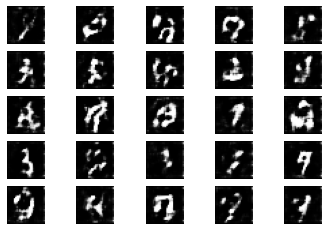

881 [D loss: 0.271796, acc.: 93.75%] [G loss: 1.016179]
882 [D loss: 0.268032, acc.: 87.50%] [G loss: 1.073933]
883 [D loss: 0.116074, acc.: 100.00%] [G loss: 1.424250]
884 [D loss: 0.080875, acc.: 100.00%] [G loss: 1.264555]
885 [D loss: 0.158183, acc.: 93.75%] [G loss: 0.965496]


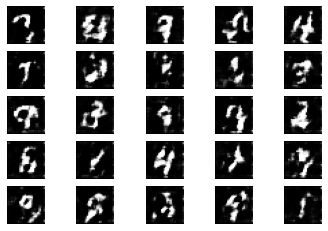

886 [D loss: 0.017068, acc.: 100.00%] [G loss: 1.215877]
887 [D loss: 0.028922, acc.: 100.00%] [G loss: 1.016637]
888 [D loss: 0.414818, acc.: 81.25%] [G loss: 0.793681]
889 [D loss: 0.023921, acc.: 100.00%] [G loss: 0.806157]
890 [D loss: 0.180975, acc.: 93.75%] [G loss: 0.683661]


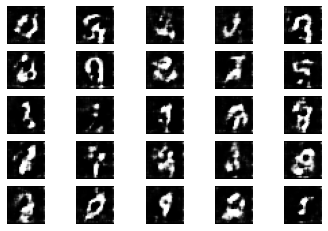

891 [D loss: 0.041400, acc.: 100.00%] [G loss: 1.205248]
892 [D loss: 0.457152, acc.: 81.25%] [G loss: 0.911235]
893 [D loss: 0.315560, acc.: 78.12%] [G loss: 1.288813]
894 [D loss: 0.070518, acc.: 100.00%] [G loss: 1.135576]
895 [D loss: 0.195052, acc.: 96.88%] [G loss: 0.896634]


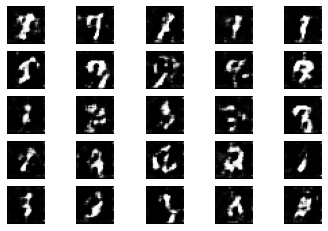

896 [D loss: 0.032115, acc.: 100.00%] [G loss: 1.221459]
897 [D loss: 0.314578, acc.: 90.62%] [G loss: 1.079645]
898 [D loss: 0.865661, acc.: 50.00%] [G loss: 1.255877]
899 [D loss: 0.256089, acc.: 87.50%] [G loss: 0.513354]
900 [D loss: 0.017165, acc.: 100.00%] [G loss: 0.713501]


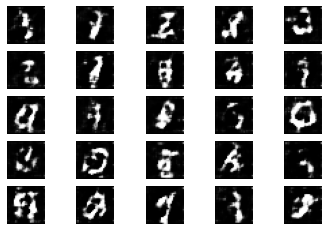

901 [D loss: 0.075610, acc.: 100.00%] [G loss: 0.984421]
902 [D loss: 0.131230, acc.: 100.00%] [G loss: 0.978630]
903 [D loss: 0.161402, acc.: 96.88%] [G loss: 0.832175]
904 [D loss: 0.183914, acc.: 96.88%] [G loss: 0.817856]
905 [D loss: 0.032771, acc.: 100.00%] [G loss: 1.364749]


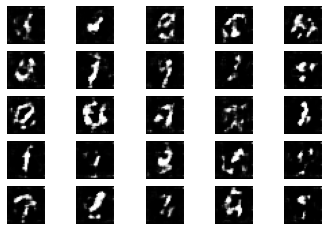

906 [D loss: 0.006137, acc.: 100.00%] [G loss: 1.555985]
907 [D loss: 0.012394, acc.: 100.00%] [G loss: 1.961452]
908 [D loss: 0.022875, acc.: 100.00%] [G loss: 1.149749]
909 [D loss: 0.012907, acc.: 100.00%] [G loss: 1.450163]
910 [D loss: 0.163248, acc.: 93.75%] [G loss: 1.863075]


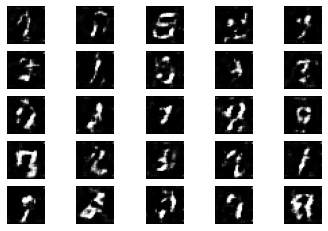

911 [D loss: 0.005606, acc.: 100.00%] [G loss: 1.918094]
912 [D loss: 0.004485, acc.: 100.00%] [G loss: 1.696987]
913 [D loss: 0.080008, acc.: 96.88%] [G loss: 1.469940]
914 [D loss: 0.034468, acc.: 100.00%] [G loss: 1.264499]
915 [D loss: 0.061351, acc.: 100.00%] [G loss: 0.785475]


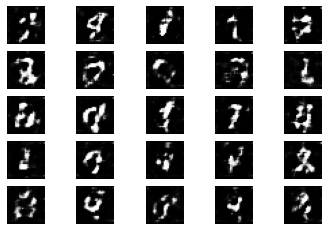

916 [D loss: 0.015878, acc.: 100.00%] [G loss: 0.778011]
917 [D loss: 0.269225, acc.: 87.50%] [G loss: 0.444836]
918 [D loss: 0.003541, acc.: 100.00%] [G loss: 0.665596]
919 [D loss: 0.046668, acc.: 100.00%] [G loss: 0.343289]
920 [D loss: 0.020726, acc.: 100.00%] [G loss: 1.319978]


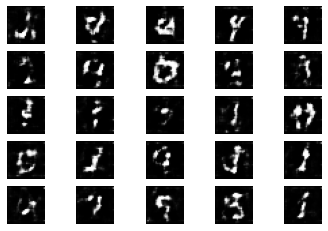

921 [D loss: 0.020364, acc.: 100.00%] [G loss: 1.238640]
922 [D loss: 0.029677, acc.: 100.00%] [G loss: 1.759437]
923 [D loss: 0.076829, acc.: 96.88%] [G loss: 1.452248]
924 [D loss: 0.003189, acc.: 100.00%] [G loss: 1.994895]
925 [D loss: 0.004676, acc.: 100.00%] [G loss: 1.253513]


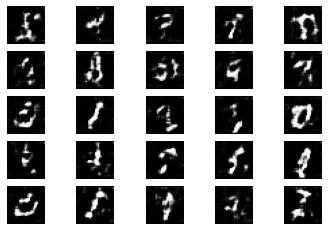

926 [D loss: 0.083385, acc.: 100.00%] [G loss: 1.596971]
927 [D loss: 0.009985, acc.: 100.00%] [G loss: 0.922812]
928 [D loss: 0.031948, acc.: 100.00%] [G loss: 0.837843]
929 [D loss: 0.037294, acc.: 100.00%] [G loss: 1.196731]
930 [D loss: 0.423757, acc.: 78.12%] [G loss: 1.074805]


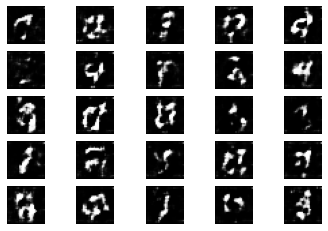

931 [D loss: 0.053480, acc.: 100.00%] [G loss: 0.630429]
932 [D loss: 0.025620, acc.: 100.00%] [G loss: 1.136657]
933 [D loss: 0.015191, acc.: 100.00%] [G loss: 0.796505]
934 [D loss: 0.018542, acc.: 100.00%] [G loss: 0.923146]
935 [D loss: 0.040006, acc.: 100.00%] [G loss: 0.705729]


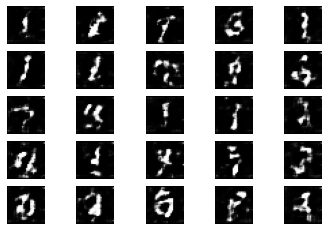

936 [D loss: 0.248643, acc.: 93.75%] [G loss: 1.053210]
937 [D loss: 0.241909, acc.: 84.38%] [G loss: 0.572972]
938 [D loss: 0.035020, acc.: 100.00%] [G loss: 0.797883]
939 [D loss: 0.021897, acc.: 100.00%] [G loss: 0.815407]
940 [D loss: 0.201146, acc.: 93.75%] [G loss: 1.321549]


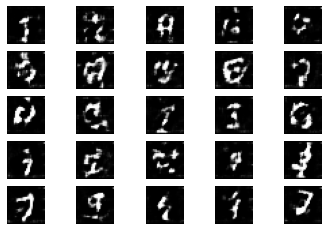

941 [D loss: 0.124163, acc.: 100.00%] [G loss: 1.968439]
942 [D loss: 0.145607, acc.: 100.00%] [G loss: 1.550827]
943 [D loss: 0.264825, acc.: 84.38%] [G loss: 0.722178]
944 [D loss: 0.027217, acc.: 100.00%] [G loss: 1.288629]
945 [D loss: 1.078785, acc.: 50.00%] [G loss: 1.360659]


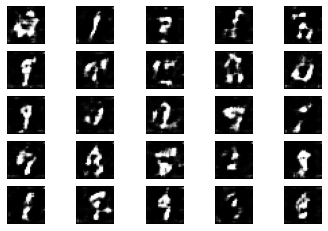

946 [D loss: 0.079240, acc.: 96.88%] [G loss: 0.781543]
947 [D loss: 0.718650, acc.: 62.50%] [G loss: 0.459916]
948 [D loss: 0.179581, acc.: 93.75%] [G loss: 0.273980]
949 [D loss: 0.457236, acc.: 71.88%] [G loss: 0.561019]
950 [D loss: 0.016391, acc.: 100.00%] [G loss: 0.668461]


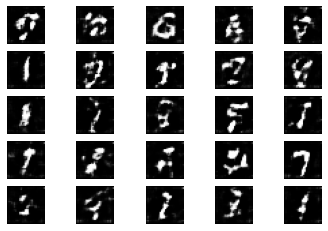

951 [D loss: 0.039794, acc.: 100.00%] [G loss: 0.897615]
952 [D loss: 0.049212, acc.: 100.00%] [G loss: 0.551057]
953 [D loss: 0.024845, acc.: 100.00%] [G loss: 0.537067]
954 [D loss: 0.032952, acc.: 100.00%] [G loss: 0.715143]
955 [D loss: 0.613881, acc.: 65.62%] [G loss: 0.673036]


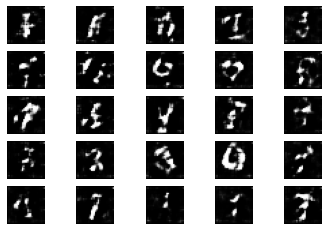

956 [D loss: 0.086755, acc.: 100.00%] [G loss: 0.380621]
957 [D loss: 0.490434, acc.: 75.00%] [G loss: 0.232389]
958 [D loss: 0.017011, acc.: 100.00%] [G loss: 0.520480]
959 [D loss: 0.124614, acc.: 100.00%] [G loss: 0.860537]
960 [D loss: 0.155059, acc.: 96.88%] [G loss: 0.456426]


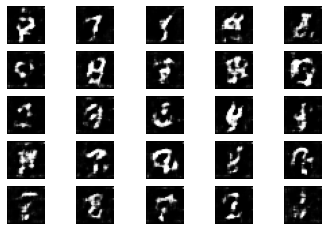

961 [D loss: 0.060634, acc.: 100.00%] [G loss: 1.201481]
962 [D loss: 0.025571, acc.: 100.00%] [G loss: 0.938326]
963 [D loss: 0.116530, acc.: 100.00%] [G loss: 1.468467]
964 [D loss: 0.257388, acc.: 84.38%] [G loss: 1.518526]
965 [D loss: 0.027488, acc.: 100.00%] [G loss: 1.046233]


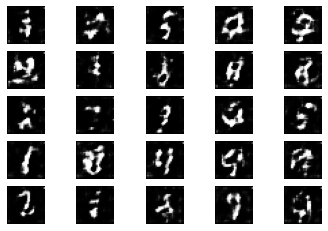

966 [D loss: 0.067935, acc.: 100.00%] [G loss: 0.959529]
967 [D loss: 0.212371, acc.: 90.62%] [G loss: 0.855426]
968 [D loss: 0.030647, acc.: 100.00%] [G loss: 0.625026]
969 [D loss: 0.097956, acc.: 96.88%] [G loss: 0.915260]
970 [D loss: 0.112802, acc.: 96.88%] [G loss: 0.562280]


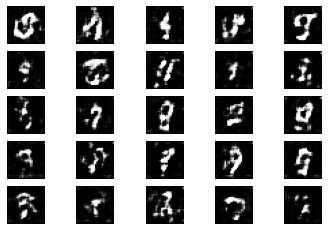

971 [D loss: 0.008037, acc.: 100.00%] [G loss: 0.752465]
972 [D loss: 0.369616, acc.: 78.12%] [G loss: 1.022536]
973 [D loss: 0.087321, acc.: 100.00%] [G loss: 0.552682]
974 [D loss: 0.063291, acc.: 100.00%] [G loss: 0.412257]
975 [D loss: 0.214363, acc.: 93.75%] [G loss: 0.561232]


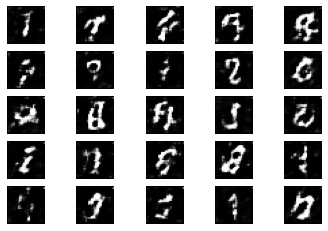

976 [D loss: 0.254070, acc.: 87.50%] [G loss: 0.615294]
977 [D loss: 0.056736, acc.: 100.00%] [G loss: 0.485409]
978 [D loss: 0.037230, acc.: 100.00%] [G loss: 0.695676]
979 [D loss: 0.007037, acc.: 100.00%] [G loss: 0.619394]
980 [D loss: 0.636590, acc.: 62.50%] [G loss: 0.884526]


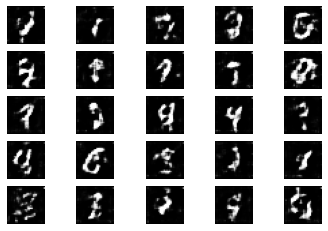

981 [D loss: 0.030350, acc.: 100.00%] [G loss: 0.702113]
982 [D loss: 0.051853, acc.: 100.00%] [G loss: 0.489616]
983 [D loss: 0.005949, acc.: 100.00%] [G loss: 0.651305]
984 [D loss: 0.075478, acc.: 100.00%] [G loss: 0.570321]
985 [D loss: 0.008331, acc.: 100.00%] [G loss: 0.678452]


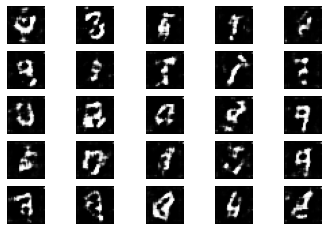

986 [D loss: 0.057165, acc.: 96.88%] [G loss: 1.995428]
987 [D loss: 0.022386, acc.: 100.00%] [G loss: 1.589609]
988 [D loss: 0.032980, acc.: 100.00%] [G loss: 2.095510]
989 [D loss: 0.005420, acc.: 100.00%] [G loss: 1.748213]
990 [D loss: 0.002139, acc.: 100.00%] [G loss: 1.842903]


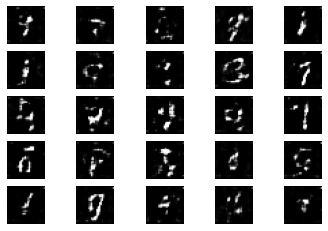

991 [D loss: 0.003916, acc.: 100.00%] [G loss: 2.418066]
992 [D loss: 0.232808, acc.: 90.62%] [G loss: 2.228245]
993 [D loss: 0.009118, acc.: 100.00%] [G loss: 2.780131]
994 [D loss: 0.001313, acc.: 100.00%] [G loss: 2.191393]
995 [D loss: 0.001296, acc.: 100.00%] [G loss: 2.016851]


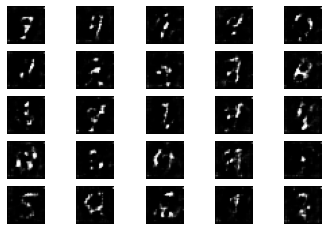

996 [D loss: 0.003061, acc.: 100.00%] [G loss: 2.726282]
997 [D loss: 0.004043, acc.: 100.00%] [G loss: 1.779079]
998 [D loss: 0.001292, acc.: 100.00%] [G loss: 2.299630]
999 [D loss: 0.002430, acc.: 100.00%] [G loss: 1.331333]


In [11]:
# Adversarial ground truths
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

for epoch in range(epochs):

    # ---------------------
    #  Train Discriminator
    # ---------------------

    # Select a random set of images
    idx = np.random.randint(0, X_train.shape[0], batch_size)
    imgs = X_train[idx]

    # Sample noise and generate a batch of new images
    noise = np.random.normal(0, 1, (batch_size, latent_dim))
    gen_imgs = generator.predict(noise)

    # Train the discriminator (real classified as ones and generated as zeros)
    d_loss_real = discriminator.train_on_batch(imgs, valid) ## Runs a single gradient update on a single batch of data.
    d_loss_fake = discriminator.train_on_batch(gen_imgs, fake) 

    # Compute the discriminator loss
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # ---------------------
    #  Train Generator
    # ---------------------

    # Train the generator (wants discriminator to mistake images as real)
    g_loss = combined.train_on_batch(noise, valid)

    # Plot the progress
    print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

    # If at save interval => save generated image samples
    if epoch % show_interval == 0:
        show_imgs(epoch)